In [1]:
import pandas as pd
import urllib.request as ur
import json
import time

from os import listdir
from os.path import isfile, join

In [2]:
import math
import requests
import itertools
import numpy as np
from datetime import datetime, timedelta

from IPython.display import clear_output

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.5)

# from wordcloud import WordCloud
# from sklearn.feature_extraction.text import TfidfVectorizer
# from textblob import TextBlob

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

Taking from the data dictionary I pick columns with at least some data

In [4]:
comment_col = [

# Unique comment details
'id',
'name',
'score',
'parent_id',
'depth',

# Main target 
'body',
'body_html',
'permalink',

# Author details
'author', 
'author_flair_css_class',
'author_flair_text',
'author_flair_text_color',
'is_submitter',

# Date 
'created',
'created_utc',
'edited',

# Parent Subreddit
'subreddit_id',
'subreddit_name_prefixed',
'subreddit_type',

# Monor attributes, may flag bots or moderators
'total_awards_received',
'can_gild',
'collapsed_reason',
'controversiality',
'distinguished',
'gilded',
'link_id',
'locked',
'no_follow',
'score_hidden',
'send_replies',
'stickied'
]    


Load up files from my data folder

In [5]:

onlyfiles = [f for f in listdir('/Users/eoinkeaney/Desktop/Cap_Stone_Data') if isfile(join('/Users/eoinkeaney/Desktop/Cap_Stone_Data', f))]

In [6]:
onlyfiles = [x for x in onlyfiles if '.csv' in x]
comment_files = [x for x in onlyfiles if 'comments' in x]

In [7]:
submission_files = [x for x in onlyfiles if 'submission' in x]

In [8]:
root_dir = '/Users/eoinkeaney/Desktop/Cap_Stone_Data/'
df_comment = pd.DataFrame()
for file in comment_files:
    file_string = f'{root_dir}{file}'
    new_list = pd.read_csv(file_string)
    df_comment = df_comment.append(new_list)
df_comment.shape

(575722, 55)

In [9]:
df_submission = pd.DataFrame()
for file in submission_files:
    file_string = f'{root_dir}{file}'
    new_list = pd.read_csv(file_string)
    df_submission = df_submission.append(new_list)
df_submission.shape

/Users/eoinkeaney/opt/anaconda3/envs/spacy/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (8,24,25,81) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


(57572, 95)

In [10]:
len(np.unique(df_submission.id))

40019

In [11]:
len(np.unique(df_comment.id))

570485

##### df_submission.drop_duplicates(subset=['id'],inplace=True,ignore_index=True)

In [7]:
df_comment.drop_duplicates(subset=['id'],inplace=True,ignore_index=True)

In [14]:
len(df_submission)

40019

Convert timestamp to readable date

In [15]:
date_clean = []
for sub in df_submission.created_utc:
#     print(sub)
    date_clean.append(datetime.fromtimestamp(sub).strftime('%Y-%m-%dT%H:%M:%SZ'))
df_submission['date_clean'] = date_clean

In [16]:
def plot_day_count(dates):
    pl = pd.DataFrame(index=pd.to_datetime(dates))
    pl['Count']=1
    pl.resample('D').sum().plot()

look at the distribution of my data

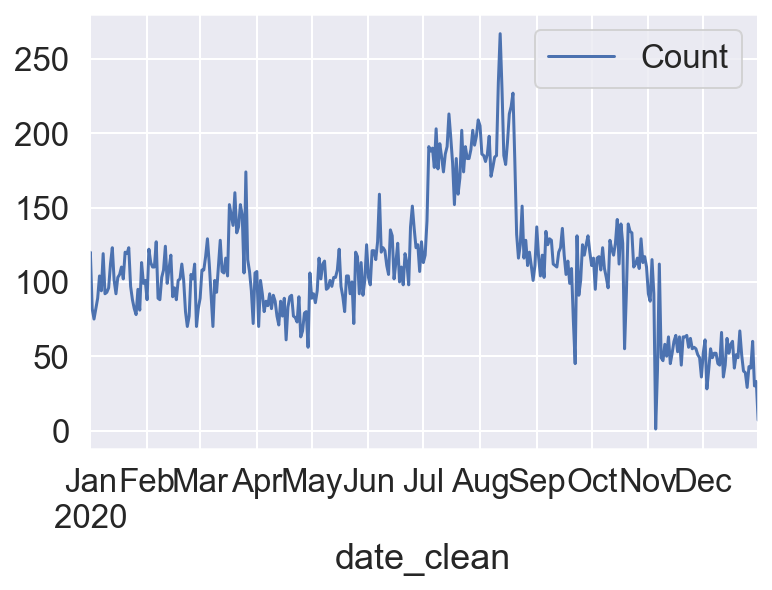

In [17]:
plot_day_count(df_submission['date_clean'])

r/Leeds
r/Edinburgh
r/london
r/manchester
r/glasgow
r/Liverpool
r/sheffield
r/Cardiff
r/Belfast


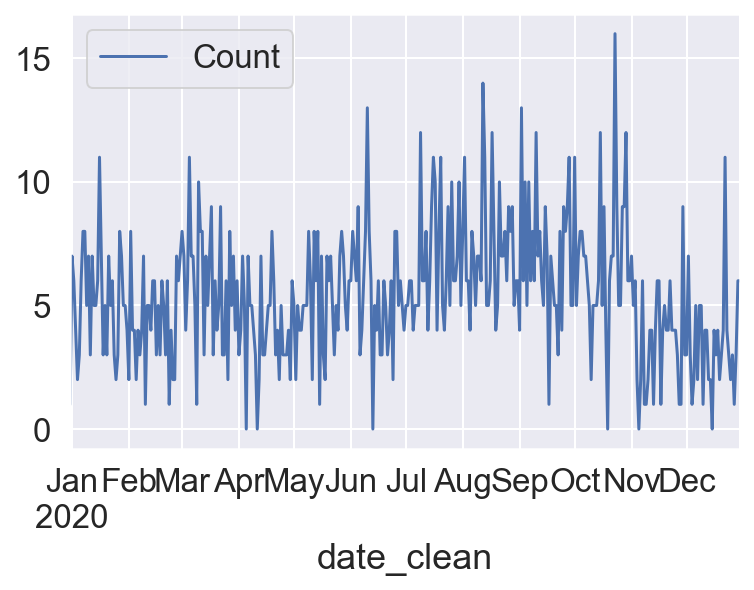

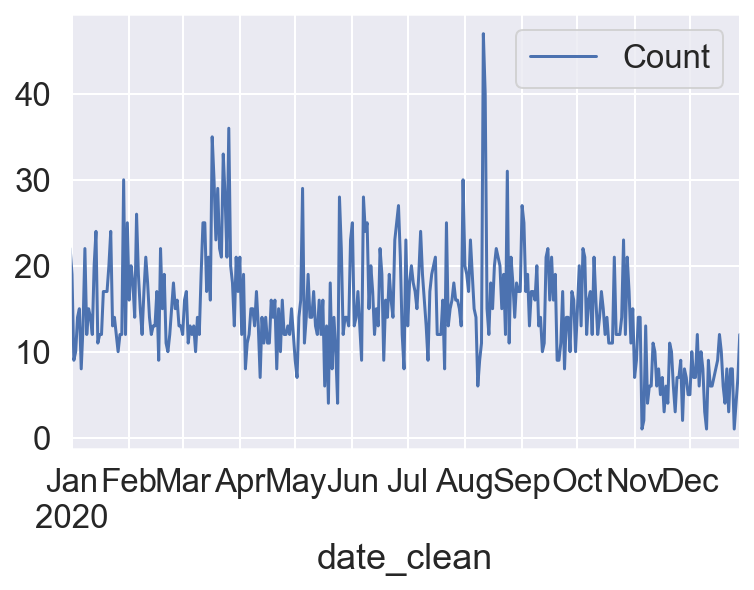

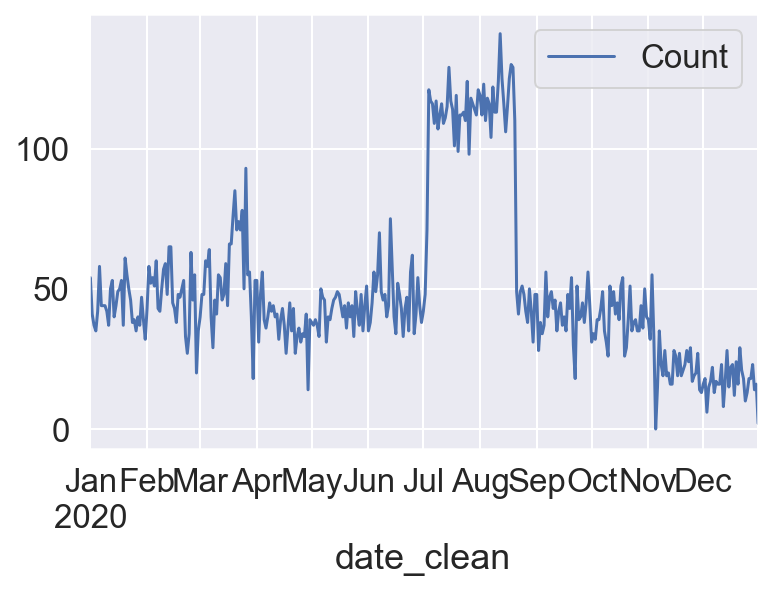

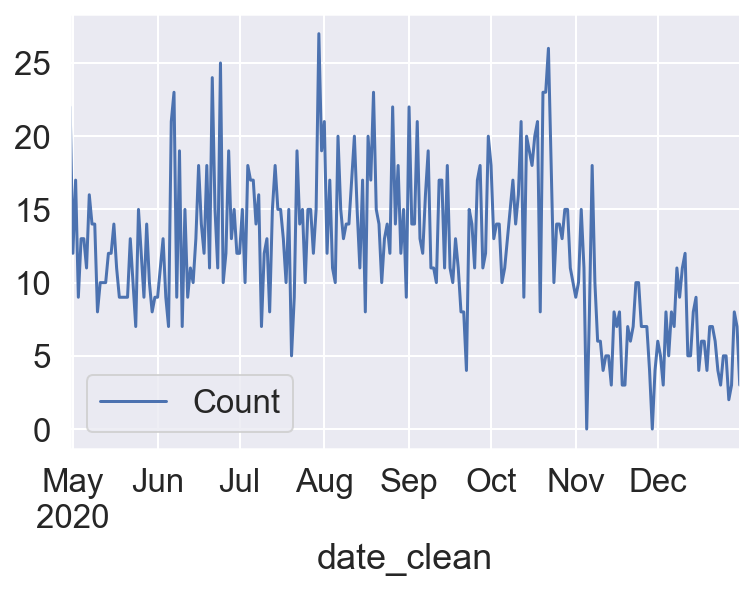

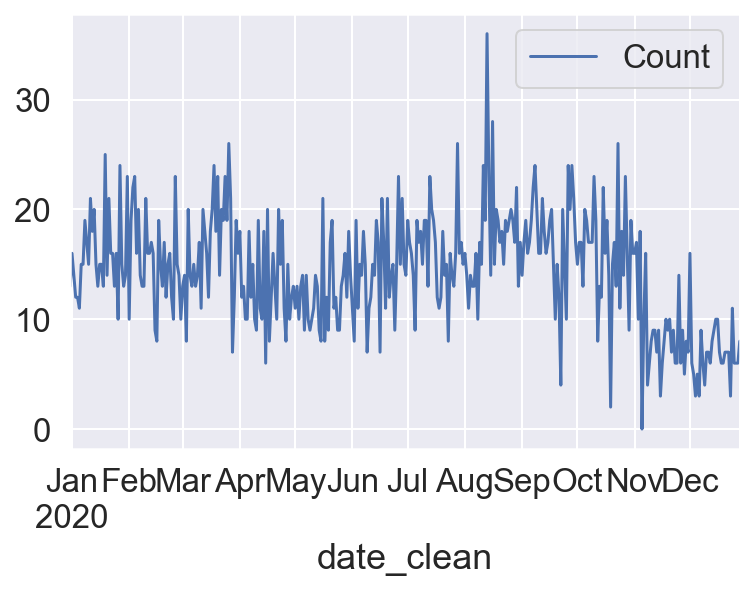

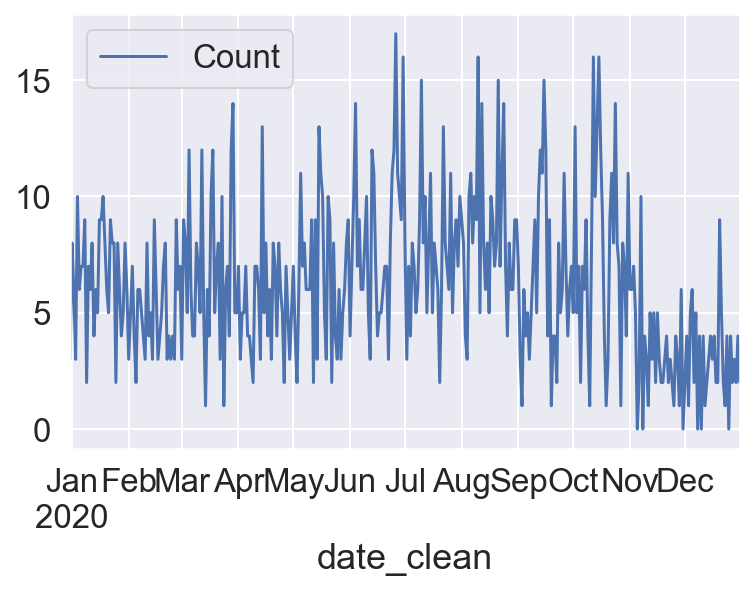

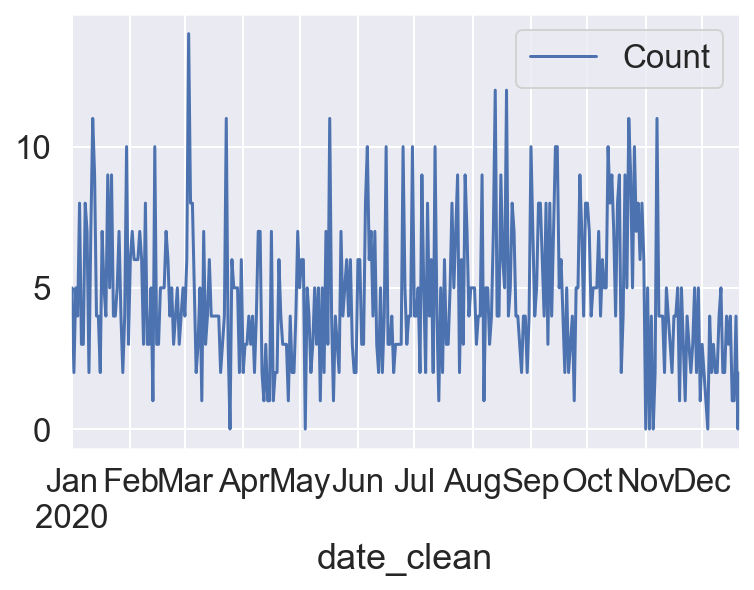

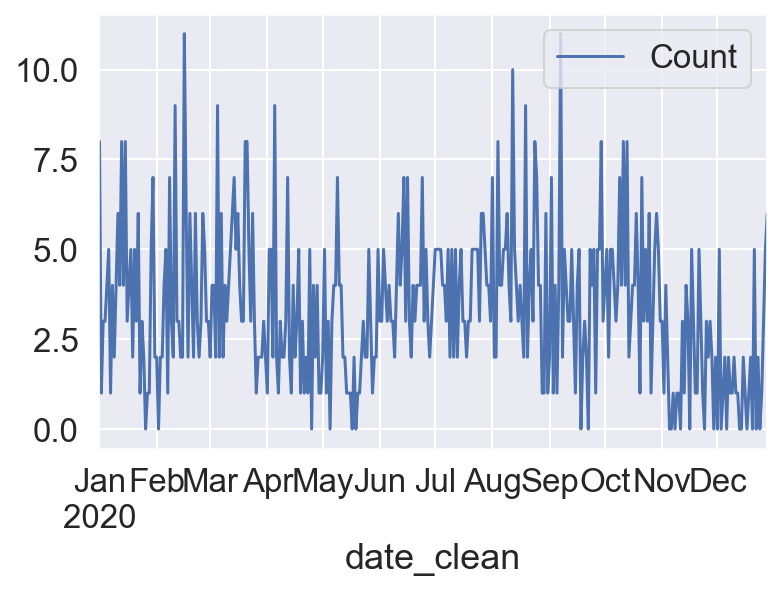

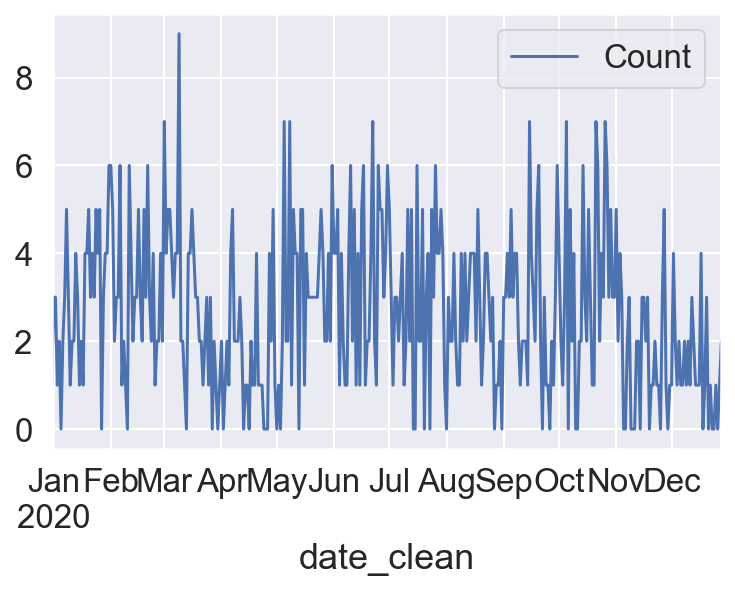

In [18]:
for city in df_submission.subreddit_name_prefixed.unique():
    print(city)
    plot_day_count(df_submission[df_submission.subreddit_name_prefixed == city]['date_clean'])

For my EDA I wanted to pick a slice of the data and decided on a 2 month period when UK went into lockdown in March 2020

In [19]:

date_range_01_start = pd.Timestamp("2020-02-20")
date_range_01_end = pd.Timestamp("2020-04-20")

Lockdown_march_2020 = pd.Timestamp("2020-03-20")

In [20]:
date_range_01_start.timestamp()

1582156800.0

In [21]:
df_range_01 = df_comment

In [22]:
df_comment.columns

Index(['Unnamed: 0', 'approved_at_utc', 'approved_by', 'archived',
       'associated_award', 'author', 'author_flair_background_color',
       'author_flair_css_class', 'author_flair_template_id',
       'author_flair_text', 'author_flair_text_color', 'banned_at_utc',
       'banned_by', 'body', 'body_html', 'can_gild', 'can_mod_post',
       'collapsed', 'collapsed_because_crowd_control', 'collapsed_reason',
       'comment_type', 'controversiality', 'created', 'created_utc', 'depth',
       'distinguished', 'downs', 'edited', 'gilded', 'id', 'is_submitter',
       'likes', 'link_id', 'locked', 'mod_note', 'mod_reason_by',
       'mod_reason_title', 'name', 'no_follow', 'num_reports', 'parent_id',
       'permalink', 'removal_reason', 'report_reasons', 'saved', 'score',
       'score_hidden', 'send_replies', 'stickied', 'subreddit_id',
       'subreddit_name_prefixed', 'subreddit_type', 'top_awarded_type',
       'total_awards_received', 'ups'],
      dtype='object')

I picked a smaller subset of columns to compare

In [8]:
comment_col_range_01 = [
'id',
'name',
'score',
'parent_id',
'depth',
'body',
'author', 
'created_utc',
'subreddit_name_prefixed',
]    


In [9]:
# df_timerange_01 = df_comment[comment_col_range_01]

In [24]:
df_timerange_01 = df_comment[(df_comment.created_utc > date_range_01_start.timestamp()) & (df_comment.created_utc < date_range_01_end.timestamp())][comment_col_range_01]


In [10]:
df_timerange_01.set_index('id',inplace=True)

In [26]:
# df_timerange_01 = df_timerange_01[df_timerange_01.index.duplicated(keep='first')]

I now have my first target dataframe

In [27]:
df_timerange_01

,name,score,parent_id,depth,body,author,created_utc,subreddit_name_prefixed
id,,,,,,,,
fkx2gjv,t1_fkx2gjv,1.0,t1_fhdulku,7.0,"Hey, how is the area around Saughton Rose Gard...",Jaraxo,1.584616e+09,r/Edinburgh
fkzqsei,t1_fkzqsei,1.0,t1_fkx2gjv,8.0,"If it’s the new build flats I’m thinking of, S...",S27L,1.584678e+09,r/Edinburgh
fl01y80,t1_fl01y80,1.0,t1_fkzqsei,9.0,Yeh a few people having issues with getting mo...,Jaraxo,1.584688e+09,r/Edinburgh
fl04hqv,t1_fl04hqv,1.0,t1_fl01y80,1.0,The mortgage issue has been the flammability,S27L,1.584691e+09,r/Edinburgh
fl04ld7,t1_fl04ld7,2.0,t1_fl04hqv,2.0,Oh dear that doesn't sound good. Then it becom...,Jaraxo,1.584691e+09,r/Edinburgh
...,...,...,...,...,...,...,...,...
fnd7rc4,t1_fnd7rc4,1.0,t3_enxl5d,0.0,"Hello there, \n\nGlasgow Mid Argyle are a Shin...",rory_mack3,1.586862e+09,r/glasgow
fimnzec,t1_fimnzec,1.0,t1_ffu2qfn,2.0,Hi -- since this post we've started lessons wi...,leagueofrobbie,1.582539e+09,r/glasgow
fj3thxh,t1_fj3thxh,1.0,t3_ew91lu,0.0,Just offices. \n\nWit school did you go tae? W...,GoldenBaws1,1.582993e+09,r/glasgow


In [11]:
date_clean = []
for sub in df_timerange_01.created_utc:
#     print(sub)
    date_clean.append(datetime.fromtimestamp(sub).strftime('%Y-%m-%dT%H:%M:%SZ'))
df_timerange_01['date'] = date_clean

<ipython-input-11-bd4159df6140>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_01['date'] = date_clean


In [29]:
df_timerange_01['date']

id
fkx2gjv    2020-03-19T11:11:07Z
fkzqsei    2020-03-20T04:14:57Z
fl01y80    2020-03-20T07:10:41Z
fl04hqv    2020-03-20T07:59:38Z
fl04ld7    2020-03-20T08:01:41Z
                   ...         
fnd7rc4    2020-04-14T11:59:43Z
fimnzec    2020-02-24T10:15:07Z
fj3thxh    2020-02-29T16:14:07Z
fj4d3sy    2020-02-29T19:44:53Z
fmzkcrm    2020-04-10T13:49:47Z
Name: date, Length: 98036, dtype: object

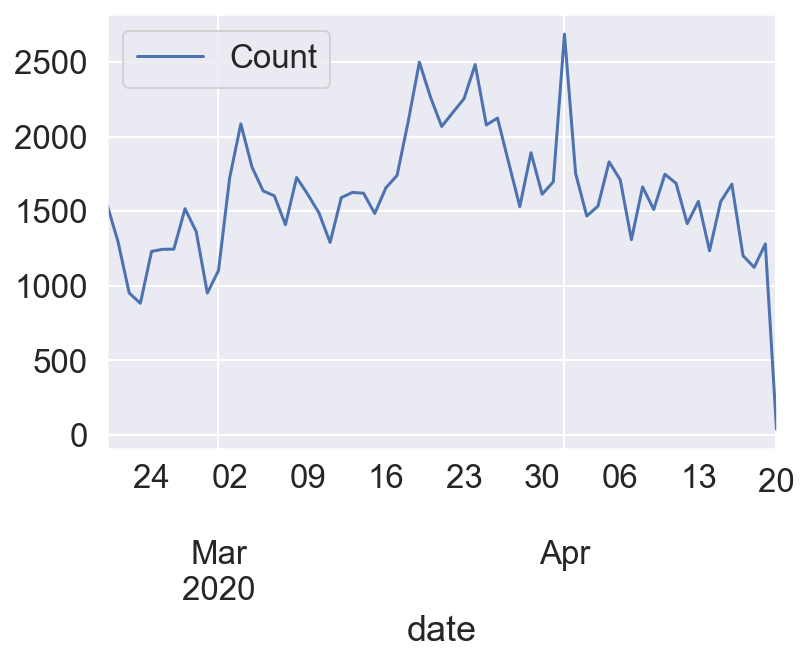

In [30]:
plot_day_count(df_timerange_01['date'])

checking distribution over date and city

In [31]:
df_timerange_01.groupby('subreddit_name_prefixed').sum()

,score,depth,created_utc
subreddit_name_prefixed,,,
r/Belfast,4117.0,1053.0,2.061274e+12
r/Cardiff,9663.0,3643.0,4.338593e+12
r/Edinburgh,69557.0,20000.0,2.387135e+13
r/Leeds,11098.0,3351.0,5.055182e+12
r/Liverpool,14292.0,4265.0,5.485120e+12
r/glasgow,91767.0,26443.0,2.824355e+13
r/london,323787.0,83256.0,8.221716e+13
r/sheffield,9257.0,2993.0,4.097578e+12


In [32]:
df_timerange_01.groupby('subreddit_name_prefixed').mean()

,score,depth,created_utc
subreddit_name_prefixed,,,
r/Belfast,3.164489,0.809377,1.584376e+09
r/Cardiff,3.529218,1.330533,1.584585e+09
r/Edinburgh,4.617739,1.327757,1.584767e+09
r/Leeds,3.478997,1.050470,1.584696e+09
r/Liverpool,4.129442,1.232303,1.584837e+09
r/glasgow,5.149374,1.483811,1.584847e+09
r/london,6.241557,1.604904,1.584879e+09
r/sheffield,3.579660,1.157386,1.584524e+09


In [12]:
body_lenght_full = []
for x in df_timerange_01.body:
    body_lenght_full.append(len(str(x).split()))
df_timerange_01['body_lenght_full'] = body_lenght_full

<ipython-input-12-5593729dea6e>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_01['body_lenght_full'] = body_lenght_full


Looking at removing comments with low word count.

In [34]:
df_timerange_01[['body','body_lenght_full']][df_timerange_01.body_lenght_full < 10]

,body,body_lenght_full
id,,
fl04hqv,The mortgage issue has been the flammability,7
fktxy8p,Hahhahahaha,1
fl12lke,littlejohns lmao,2
fl12oya,twas little johns,3
fmqcpmk,[deleted],1
...,...,...
fnfe0ep,Happy to give it a go!,6
fngvewn,I'm happy to help too!,5
fnfb240,Depends completely on your budget :),6


<AxesSubplot:>

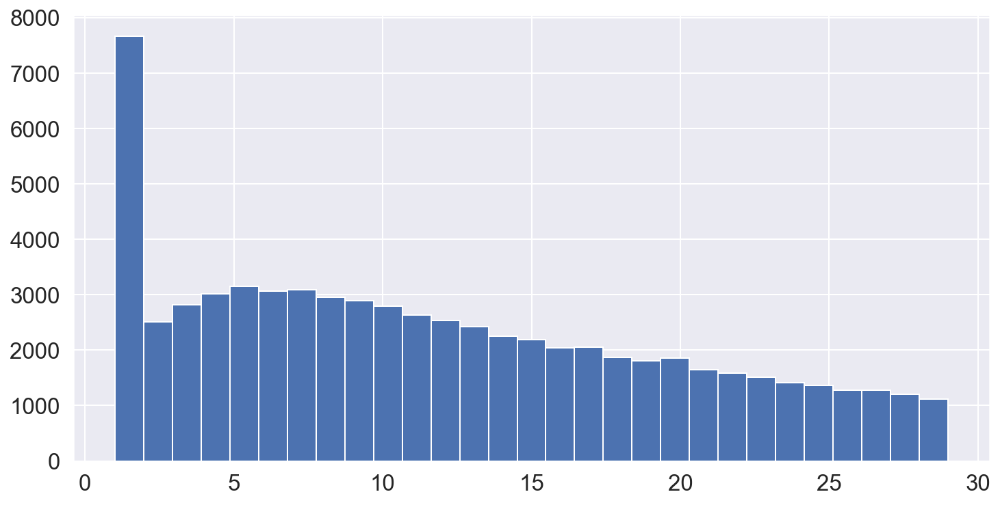

In [35]:
df_timerange_01[df_timerange_01.body_lenght_full < 30].body_lenght_full.hist(figsize=(12,6), bins = 29)

There is a lot of 1 word comments,

In [36]:
print('Number of deleted comments: ', len(df_timerange_01[df_timerange_01.body == '[deleted]']))

Number of deleted comments:  4428


In [37]:
df_timerange_01.body[df_timerange_01.body_lenght_full == 1].value_counts().head(50)

[deleted]           4428
[removed]            485
Thanks!               67
Nice                  27
Lol                   26
Thanks                25
Why?                  25
😂                     24
Done                  22
Yes                   21
No.                   21
?                     20
No                    17
Cheers!               17
Yes.                  16
What?                 14
Done!                 14
Good                  13
Thanks.               13
Done.                 13
.                     12
Yes!                  12
Cheers                11
Source?               11
Nope.                 10
Good.                 10
Yep                   10
Nice.                  9
Exactly.               9
lol                    9
Same                   8
Eh?                    7
Haha                   7
:)                     7
Cheers.                7
Beautiful.             7
Aye                    6
Cringe                 6
Congratulations!       6
Boat                   5


In [38]:
df_timerange_01[['body','body_lenght_full']][df_timerange_01.body_lenght_full > 10]

,body,body_lenght_full
id,,
fkx2gjv,"Hey, how is the area around Saughton Rose Gard...",35
fkzqsei,"If it’s the new build flats I’m thinking of, S...",30
fl01y80,Yeh a few people having issues with getting mo...,38
fl04ld7,Oh dear that doesn't sound good. Then it becom...,49
fimd8al,Headhunters is the best for Muay Thai and MMA ...,14
...,...,...
flweq1d,Definitely Wyliecoat. I remember the dog havi...,35
fnd7rc4,"Hello there, \n\nGlasgow Mid Argyle are a Shin...",111
fimnzec,Hi -- since this post we've started lessons wi...,20


In [13]:
# Filter out comments less than 10 words
df_timerange_02 = df_timerange_01[df_timerange_01.body_lenght_full >= 10]

In [14]:
df_timerange_02.columns

Index(['name', 'score', 'parent_id', 'depth', 'body', 'author', 'created_utc',
       'subreddit_name_prefixed', 'date', 'body_lenght_full'],
      dtype='object')

lets see if there is any correlation between word count and score

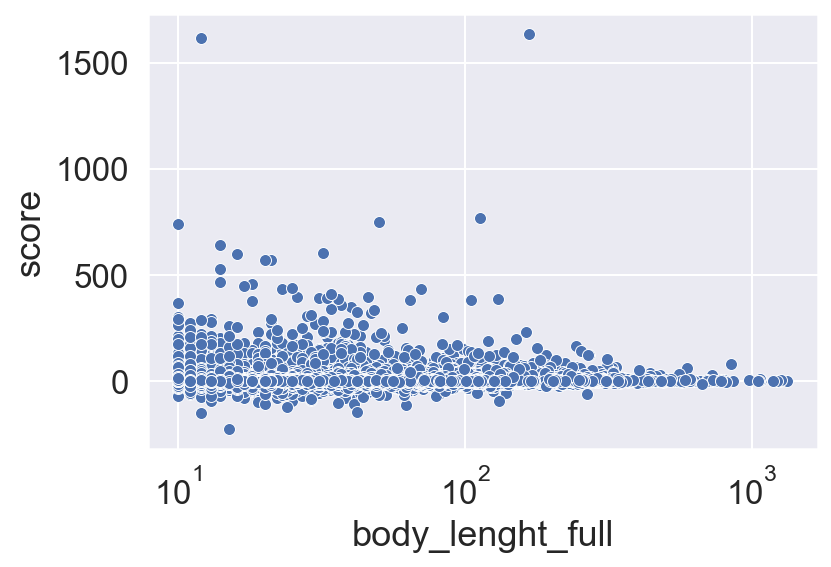

In [41]:
splot = sns.scatterplot(x='body_lenght_full',y='score',data=df_timerange_02)
splot.set(xscale="log")
plt.show()

Distribution of score values

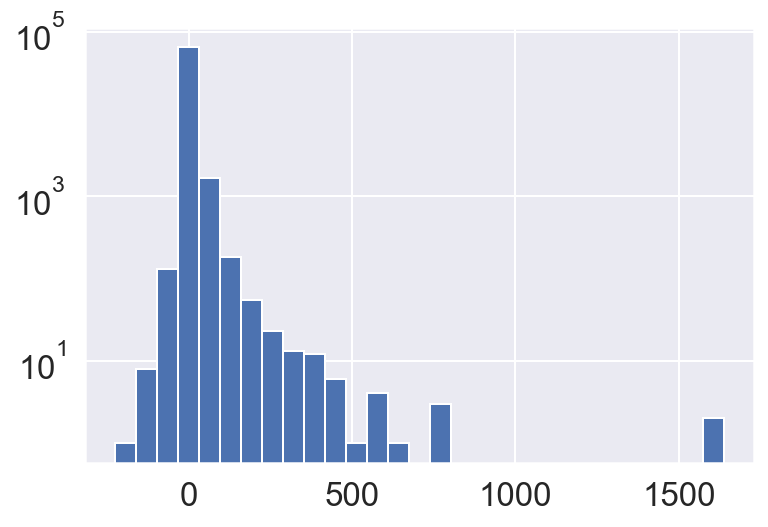

In [42]:
fig, ax = plt.subplots()
df_timerange_02.score.hist(ax=ax, bins = 29)
ax.set_yscale('log')

In [43]:
df_timerange_02[df_timerange_02.score > 1000]

,name,score,parent_id,depth,body,author,created_utc,subreddit_name_prefixed,date,body_lenght_full
id,,,,,,,,,,
fkwy8k3,t1_fkwy8k3,1637.0,t3_fl6anj,0.0,This comment is for the attention of the Daily...,NaN,1.584611e+09,r/london,2020-03-19T09:46:15Z,167
fm1yynb,t1_fm1yynb,1618.0,t3_fskuu4,0.0,BRB just going out on my balcony to clap for a...,lastaccountgotlocked,1.585688e+09,r/london,2020-03-31T21:46:00Z,12


In [44]:
df_timerange_02.index.value_counts()

fjw5i6p    1
fn99y68    1
fl7ub4q    1
fjl00l0    1
fngrk1z    1
          ..
fmbsu25    1
fjigv8i    1
fi7hgmy    1
fl3aeqv    1
fnv7jk3    1
Name: id, Length: 66878, dtype: int64

In [45]:
df_timerange_02[df_timerange_02.index == 'fkwx3zv']

,name,score,parent_id,depth,body,author,created_utc,subreddit_name_prefixed,date,body_lenght_full
id,,,,,,,,,,
fkwx3zv,t1_fkwx3zv,9.0,t3_fl6egw,0.0,"My colleague just finished a night shift, she ...",wilburtino,1.584610e+09,r/london,2020-03-19T09:22:10Z,36


Lets try and add some basic word sentiment analysis to my texts

In [15]:
import spacy
import tqdm

In [16]:
en_nlp = spacy.load('en_core_web_sm')

In [48]:
parsed = en_nlp(df_timerange_02['body'][3])

In [49]:
parsed

Oh dear that doesn't sound good. Then it becomes a health issue. Last thing I want is to be part of another Grenfell...

I really appreciate the advice.

Lots of other properties in that area though, and got some in Roseburn booked in to look at as well. 

Thanks!

In [17]:
def process_text(documents, pos=False):
    '''
    cleans sentences from stop words and punctuation and filters by pos tags if given
    returns cleaned sentence and tokenized sentence
    '''
    nlp = spacy.load('en_core_web_sm')
    
    texts = []
    tokenised_texts = []

    if pos: # pos can either be False or a list of parts of speech
        for document in tqdm.tqdm(nlp.pipe(documents, batch_size=200)):
            assert document.is_parsed
            tokens = [token
                      for token in document 
                      if token.is_stop == False
                      and token.pos_ in pos
                      and token.pos_ != 'PUNCT']
            doc_ = ''
            for token in tokens:
                doc_ += str(token) + ' '
            
            doc_ = doc_.strip()
            texts.append(doc_)
            tokenised_texts.append(tokens)
    
    
    else:    
        for document in tqdm.tqdm(nlp.pipe(documents, batch_size=200)):
            assert document.is_parsed
            tokens = [token
                      for token in document 
                      if token.is_stop == False
                      and token.pos_ != 'PUNCT']
            doc_ = ''
            for token in tokens:
                doc_ += str(token) + ' '
            
            doc_ = doc_.strip()
            texts.append(doc_)
            tokenised_texts.append(tokens)
            
    return texts, tokenised_texts

In [18]:
pos = ['NOUN', 'ADJ', 'VERD', 'ADV']

In [19]:
sen = pd.read_csv('/Users/eoinkeaney/Desktop/GA/DSI16-lessons/week09/day5_nlp class/sentiment-analysis-lab/datasets/word_sentiments.csv')

In [20]:
sen[sen.word=='clear']

,pos,word,pos_score,neg_score,objectivity,pos_vs_neg
3929,ADJ,clear,0.404412,0.058824,0.536765,0.345588
42289,NOUN,clear,0.125000,0.000000,0.875000,0.125000
139922,ADV,clear,0.187500,0.000000,0.812500,0.187500
145638,VERB,clear,0.062500,0.020833,0.916667,0.041667


In [21]:
from collections import defaultdict
sen_dict = defaultdict(dict) # set up a default dictionary with an empty dictionary as default value

for row in tqdm.tqdm(sen.itertuples()):
    sen_dict[row.pos][row.word] = {'objectivity': row.objectivity, 'pos_vs_neg': row.pos_vs_neg}

155287it [00:00, 748187.18it/s]


In [22]:
processed_quotes, tokenised_quotes = process_text(df_timerange_02.body, pos=pos)

398939it [31:34, 210.55it/s]


In [56]:
processed_quotes

['area Gorgie fine area little rougher new build flats office space development gardens',
 'new build flats massive issues completion mortgages flammability search development sub',
 'people issues mortgages concerns buyers 12months biggest concern area',
 'good health issue thing advice Lots properties area',
 'Headhunters best word',
 'finally ties',
 'Good mate',
 'stalk morrisons city centre ago worth close',
 'contact details',
 'Neills earlier week',
 'units north company warehouse restaurant trade open public',
 'local pharmacies stock able alternative medically trained harm',
 'far',
 'genetic disorder lot medication script days',
 'stock lift distance reason drive',
 'hospital pharmacies pharmacies dispense patients better pharmacies',
 'online pharmacies prescription drugs online prescription online order chance pharmacies ball case scenario long term supply',
 'Nice photos people social distancing rules pleasantly surprised',
 'morning socially runners dog walkers point nice

In [57]:
df_timerange_02.body.values

array(["Hey, how is the area around Saughton Rose Gardens? Gorgie side looks fine but Stenhouse area looks a little rougher? There's some new build flats (converted office space) in a development right no the gardens.",
       'If it’s the new build flats I’m thinking of, STAY AWAY. There’s been massive issues with completion, mortgages and flammability - search the name of the development on this sub',
       "Yeh a few people having issues with getting mortgages so I understand those concerns for buyers but I'm looking for somewhere to rent for 12months before I buy elsewhere myself. \n\nMy biggest concern was the area it's in.",
       ...,
       "Hi -- since this post we've started lessons with Total Swimming at Shawlands Academy. It's great, my daughter loves it.",
       'Just offices. \n\nWit school did you go tae? Wits your maws maiden name?',
       'Fuck me is this Frankie Boyle? Any other class patter or is that you done golden baws 1?'],
      dtype=object)

In [23]:
df_timerange_02['processed_quote'] = processed_quotes
df_timerange_02['tokenised_quotes'] = tokenised_quotes

<ipython-input-23-728868ed3440>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_02['processed_quote'] = processed_quotes
<ipython-input-23-728868ed3440>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_02['tokenised_quotes'] = tokenised_quotes


In [59]:
sen_dict

defaultdict(dict,
            {'ADJ': {'.22-caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.22-calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.22_caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.22_calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.38-caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.38-calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.38_caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.38_calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.45-caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.45-calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.45_caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.45_calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '0': {'objectivity': 0.5, 'pos_vs_neg': -0.5},
              '1': {'objectivity': 0.75, 'pos_vs_neg': -0.25},
           

In [24]:
def scorer(parsed):
    
    obj_scores, pvn_scores = [], []
    
    for token in parsed:
        try:
            obj_scores.append(sen_dict[token.pos_][token.lemma_]['objectivity'])
            pvn_scores.append(sen_dict[token.pos_][token.lemma_]['pos_vs_neg'])
        except:
            pass
    
    if not obj_scores:
        obj_scores = [1.]
    if not pvn_scores:
        pvn_scores = [0.]
        
    return [np.mean(obj_scores), np.mean(pvn_scores)]

In [61]:
scorer('folk round trolley loads bog rolls bizarre bread')

[1.0, 0.0]

In [62]:
sen_dict['adj']

{}

In [63]:
df_timerange_02['tokenised_quotes']

id
fkx2gjv    [area, Gorgie, fine, area, little, rougher, ne...
fkzqsei    [new, build, flats, massive, issues, completio...
fl01y80    [people, issues, mortgages, concerns, buyers, ...
fl04ld7    [good, health, issue, thing, advice, Lots, pro...
fimd8al                            [Headhunters, best, word]
                                 ...                        
flweq1d              [Definitely, dog, celtic, celtic, haha]
fnd7rc4    [team, good, coaching, great, bunch, guys, gir...
fimnzec                     [post, lessons, great, daughter]
fj3thxh                 [offices, school, tae, maws, maiden]
fj4d3sy                        [Fuck, class, patter, golden]
Name: tokenised_quotes, Length: 66878, dtype: object

In [64]:
scorer(['help','love'])

[1.0, 0.0]

In [25]:
scores = df_timerange_02['tokenised_quotes'].map(scorer)
df_timerange_02['objectivity_avg'] = scores.map(lambda x: x[0])
df_timerange_02['polarity_avg'] = scores.map(lambda x: x[1])

<ipython-input-25-023a1153b19c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_02['objectivity_avg'] = scores.map(lambda x: x[0])
<ipython-input-25-023a1153b19c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_02['polarity_avg'] = scores.map(lambda x: x[1])


In [37]:
df_timerange_02.to_csv('/Users/eoinkeaney/Desktop/Cap_Stone_Data/comm_sentament_score_ver_7_29-4-2021')

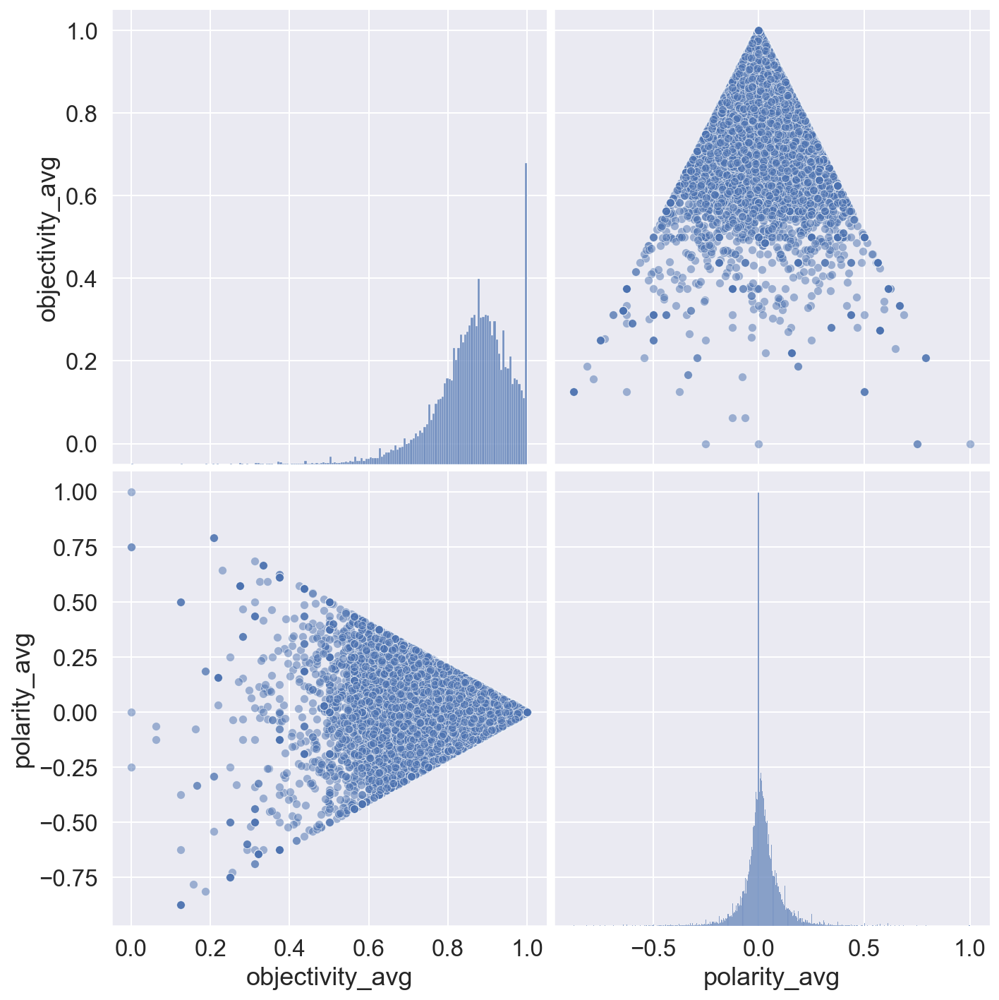

In [66]:
sns.pairplot(df_timerange_02, vars=['objectivity_avg', 'polarity_avg'], 
             plot_kws={'alpha': 0.5}, height=5)
plt.show()

Not sure what I expected with the above pair plot on polarity_avg and objectivity, I suspect that there is a lot of comment in my dataset that are null

In [67]:
df_timerange_02.objectivity_avg.mean()

0.8611954660904576

In [68]:
sen_dict

defaultdict(dict,
            {'ADJ': {'.22-caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.22-calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.22_caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.22_calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.38-caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.38-calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.38_caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.38_calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.45-caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.45-calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.45_caliber': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '.45_calibre': {'objectivity': 1.0, 'pos_vs_neg': 0.0},
              '0': {'objectivity': 0.5, 'pos_vs_neg': -0.5},
              '1': {'objectivity': 0.75, 'pos_vs_neg': -0.25},
           

Now lets add Vader Sentiment to the same data frame

In [30]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [31]:
analyzer = SentimentIntensityAnalyzer()
vader_scores = df_timerange_02['body'].map(analyzer.polarity_scores)

In [71]:
vader_scores.head()

id
fkx2gjv    {'neg': 0.084, 'neu': 0.879, 'pos': 0.037, 'co...
fkzqsei    {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...
fl01y80    {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...
fl04ld7    {'neg': 0.042, 'neu': 0.747, 'pos': 0.212, 'co...
fimd8al    {'neg': 0.0, 'neu': 0.756, 'pos': 0.244, 'comp...
Name: body, dtype: object

In [32]:
from sklearn.feature_extraction import DictVectorizer

In [33]:
dvec = DictVectorizer()

vader_scores = dvec.fit_transform(vader_scores)
vader_scores

dvec.feature_names_

['compound', 'neg', 'neu', 'pos']

In [34]:
for i, col in enumerate(dvec.feature_names_):
    df_timerange_02['vader_{}'.format(col)] = vader_scores[:, i].toarray().ravel()

<ipython-input-34-4d34bbb45599>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_02['vader_{}'.format(col)] = vader_scores[:, i].toarray().ravel()


In [36]:
df_timerange_02.shape


(398939, 18)

I still didn't have a suitable target value, I created two boolean columns (London / not London) and (before lockdown / after lockdown)

In [76]:
df_timerange_02.subreddit_name_prefixed.unique()

array(['r/Edinburgh', 'r/Leeds', 'r/london', 'r/glasgow', 'r/Cardiff',
       'r/Liverpool', 'r/Belfast', 'r/sheffield'], dtype=object)

In [77]:
df_timerange_02['london'] = [1 if x == 'r/london' else 0 for x in df_timerange_02.subreddit_name_prefixed]

<ipython-input-77-b31d105a5377>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_02['london'] = [1 if x == 'r/london' else 0 for x in df_timerange_02.subreddit_name_prefixed]


In [78]:
df_timerange_02['lockdown'] = [1 if x > Lockdown_march_2020.timestamp() else 0 for x in df_timerange_02.created_utc]

<ipython-input-78-80df6079b11e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_02['lockdown'] = [1 if x > Lockdown_march_2020.timestamp() else 0 for x in df_timerange_02.created_utc]


I ran some pair plots to see if there is any interesting clumping

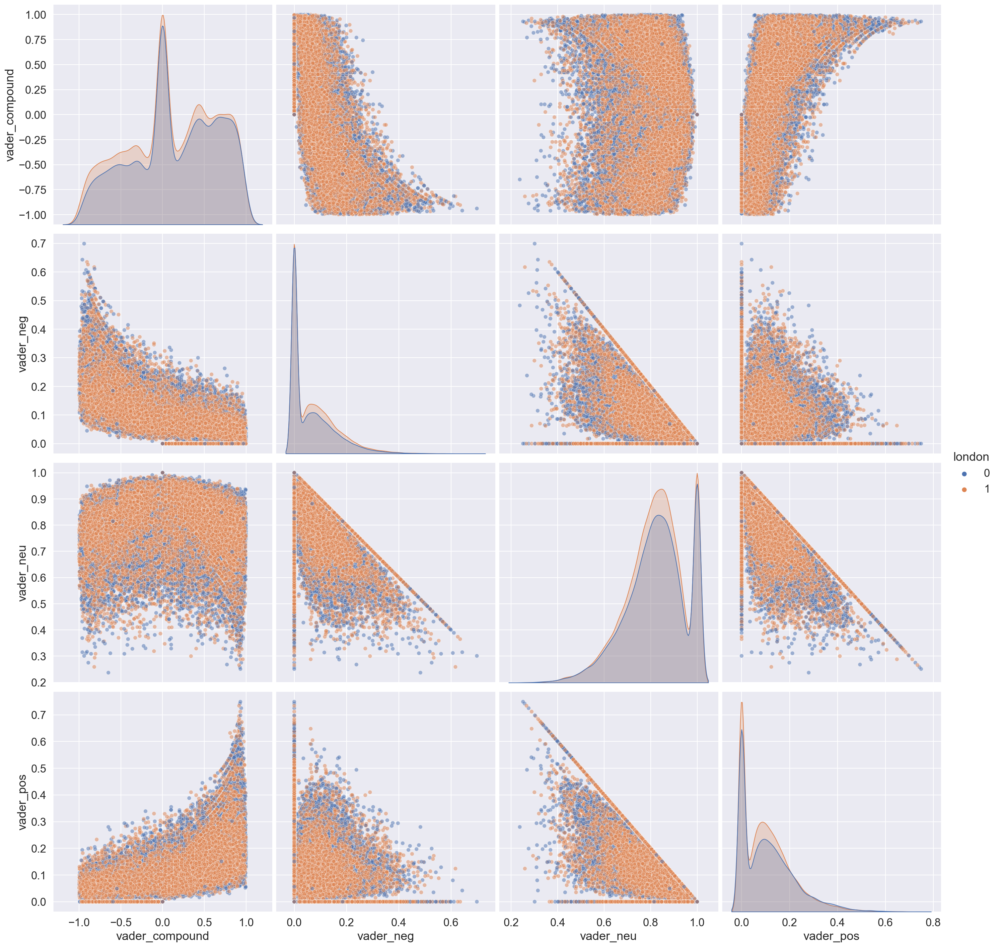

In [79]:
sns.pairplot(df_timerange_02, vars=['vader_compound','vader_neg','vader_neu','vader_pos'], hue='london',
             plot_kws={'alpha': 0.5}, height=5)
plt.show()

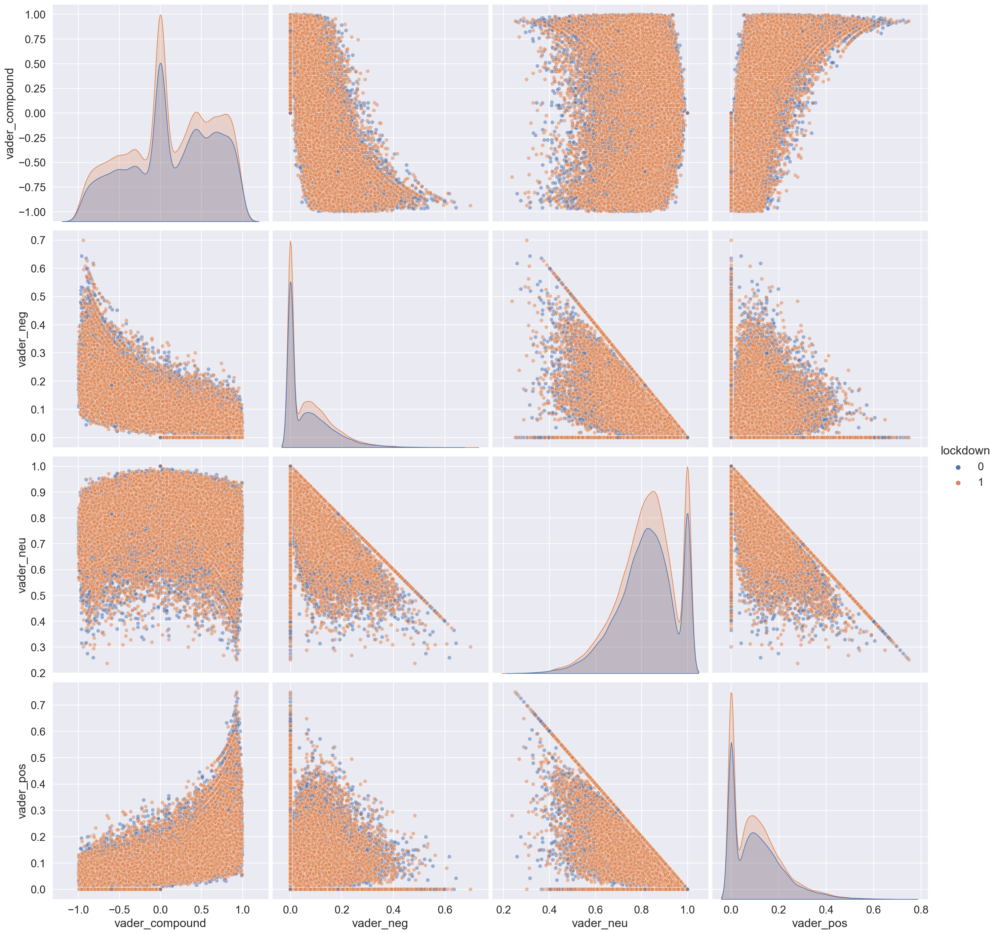

In [80]:
sns.pairplot(df_timerange_02, vars=['vader_compound','vader_neg','vader_neu','vader_pos'], hue='lockdown',
             plot_kws={'alpha': 0.5}, height=5)
plt.show()

I did some quick analysis of authors and scores.

In [81]:
author_score = df_timerange_02[['author','score']].groupby('author').sum()

<AxesSubplot:ylabel='Frequency'>

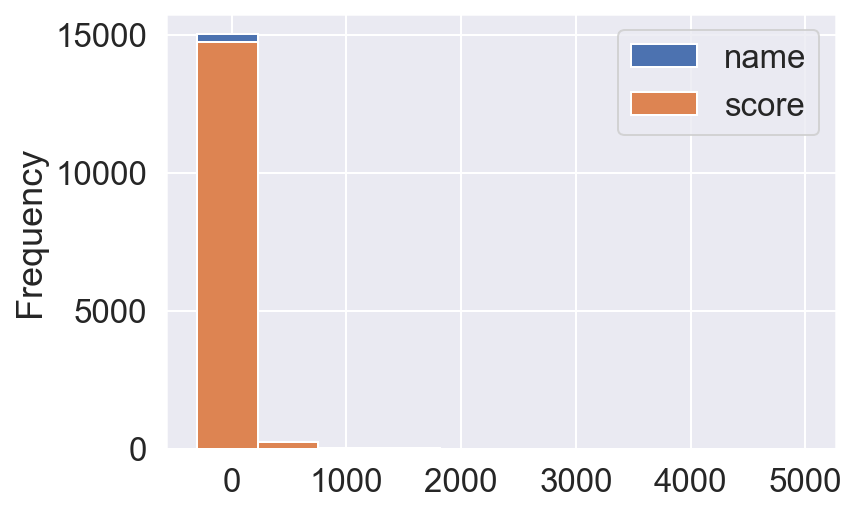

In [82]:
df_timerange_02.groupby('author').agg({'name':'count','score':'sum'}).reset_index().sort_values('score',ascending=False).plot.hist()

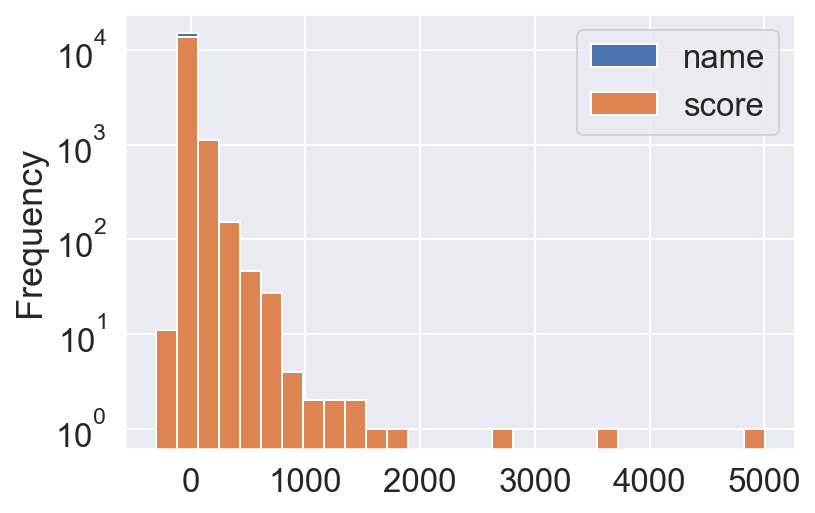

In [83]:
fig, ax = plt.subplots()
df_timerange_02.groupby('author').agg({'name':'count','score':'sum'}).reset_index().sort_values('score',ascending=False).plot.hist(ax=ax, bins = 29)
ax.set_yscale('log')

I wanted to compare the results of the two word sentiment analysis and other int values

In [84]:
df_timerange_02.head(3)

,name,score,parent_id,depth,body,author,created_utc,subreddit_name_prefixed,date,body_lenght_full,processed_quote,tokenised_quotes,objectivity_avg,polarity_avg,vader_compound,vader_neg,vader_neu,vader_pos,london,lockdown
id,,,,,,,,,,,,,,,,,,,,
fkx2gjv,t1_fkx2gjv,1.0,t1_fhdulku,7.0,"Hey, how is the area around Saughton Rose Gard...",Jaraxo,1.584616e+09,r/Edinburgh,2020-03-19T11:11:07Z,35,area Gorgie fine area little rougher new build...,"[area, Gorgie, fine, area, little, rougher, ne...",0.915066,0.002359,-0.4137,0.084,0.879,0.037,0,0
fkzqsei,t1_fkzqsei,1.0,t1_fkx2gjv,8.0,"If it’s the new build flats I’m thinking of, S...",S27L,1.584678e+09,r/Edinburgh,2020-03-20T04:14:57Z,30,new build flats massive issues completion mort...,"[new, build, flats, massive, issues, completio...",0.901564,-0.003394,0.0000,0.000,1.000,0.000,0,1
fl01y80,t1_fl01y80,1.0,t1_fkzqsei,9.0,Yeh a few people having issues with getting mo...,Jaraxo,1.584688e+09,r/Edinburgh,2020-03-20T07:10:41Z,38,people issues mortgages concerns buyers 12mont...,"[people, issues, mortgages, concerns, buyers, ...",0.860118,0.013440,0.0000,0.000,1.000,0.000,0,1


In [85]:
int_values = ['score','body_lenght_full','vader_compound','vader_neg','vader_neu','vader_pos','london','lockdown','objectivity_avg','polarity_avg']

In [86]:
df_timerange_02[int_values].corr()

,score,body_lenght_full,vader_compound,vader_neg,vader_neu,vader_pos,london,lockdown,objectivity_avg,polarity_avg
score,1.000000,0.012838,-0.018258,0.018316,0.000109,-0.014924,0.049122,0.011407,0.007785,-0.009061
body_lenght_full,0.012838,1.000000,0.041066,0.010855,0.045774,-0.062005,0.031763,0.008140,0.021587,-0.019924
vader_compound,-0.018258,0.041066,1.000000,-0.654011,-0.116981,0.665065,-0.035561,-0.016041,-0.048605,0.343582
vader_neg,0.018316,0.010855,-0.654011,1.000000,-0.535039,-0.186751,0.038651,0.009362,-0.238792,-0.303086
vader_neu,0.000109,0.045774,-0.116981,-0.535039,1.000000,-0.730041,-0.005663,0.006787,0.441828,-0.065960
vader_pos,-0.014924,-0.062005,0.665065,-0.186751,-0.730041,1.000000,-0.024659,-0.015467,-0.320601,0.321867
london,0.049122,0.031763,-0.035561,0.038651,-0.005663,-0.024659,1.000000,0.056939,-0.017623,-0.016144
lockdown,0.011407,0.008140,-0.016041,0.009362,0.006787,-0.015467,0.056939,1.000000,0.007183,-0.009791
objectivity_avg,0.007785,0.021587,-0.048605,-0.238792,0.441828,-0.320601,-0.017623,0.007183,1.000000,-0.089991
polarity_avg,-0.009061,-0.019924,0.343582,-0.303086,-0.065960,0.321867,-0.016144,-0.009791,-0.089991,1.000000


In [87]:
df_int_values = df_timerange_02[int_values]

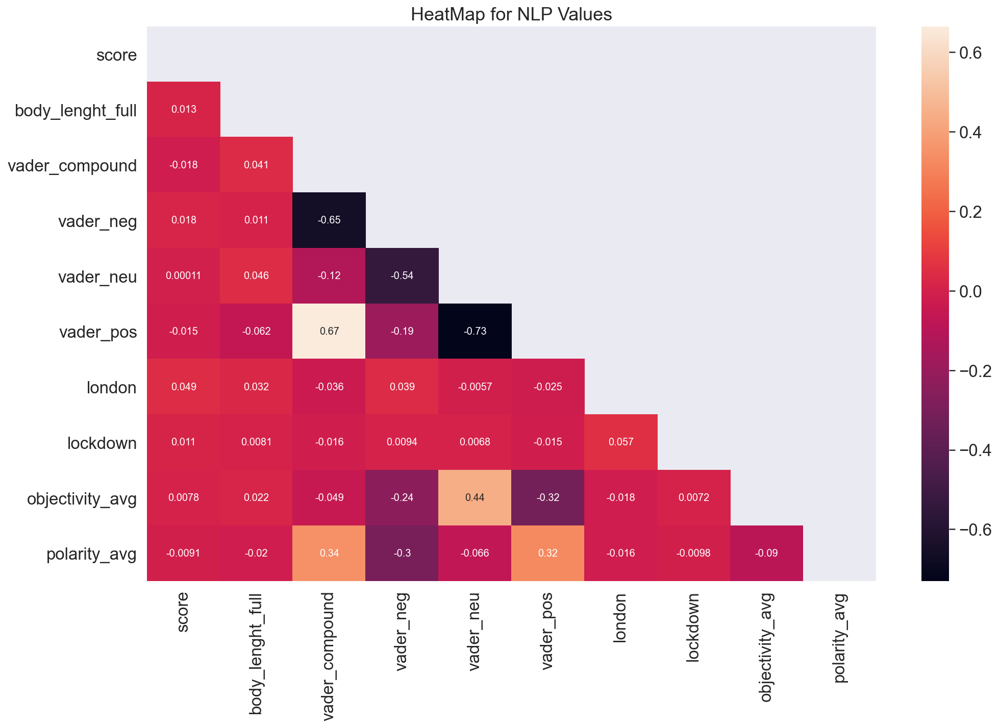

In [88]:
# Set the default matplotlib figure size:
fig, ax = plt.subplots(figsize=(16, 10))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(df_int_values.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
sns.heatmap(df_int_values.corr(), mask=mask, annot=True, ax=ax)
# ax.set_yticks(np.arange(0, X.shape[1])+0.1)
# ax.set_ylim([X.shape[1], 0])
plt.title('HeatMap for NLP Values')
plt.show()

Nothing jumping out of the correlation map, vadar values are corr with them selfs and a little bit with objectivity_avg and polarity_avg

score is not corr with any other value.

<AxesSubplot:>

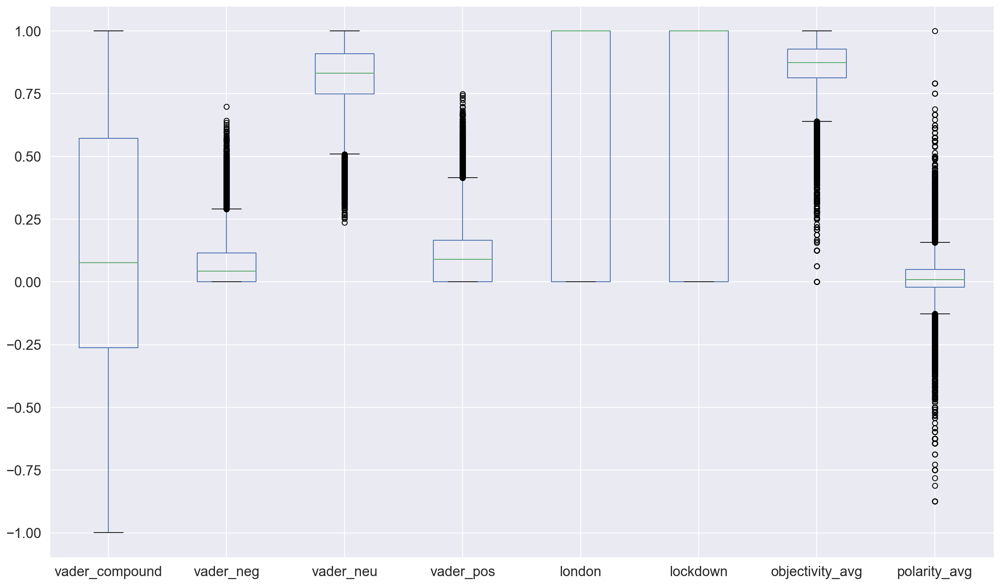

In [89]:
df_int_values.iloc[:,2:].plot.box(figsize=(20,12))

<AxesSubplot:>

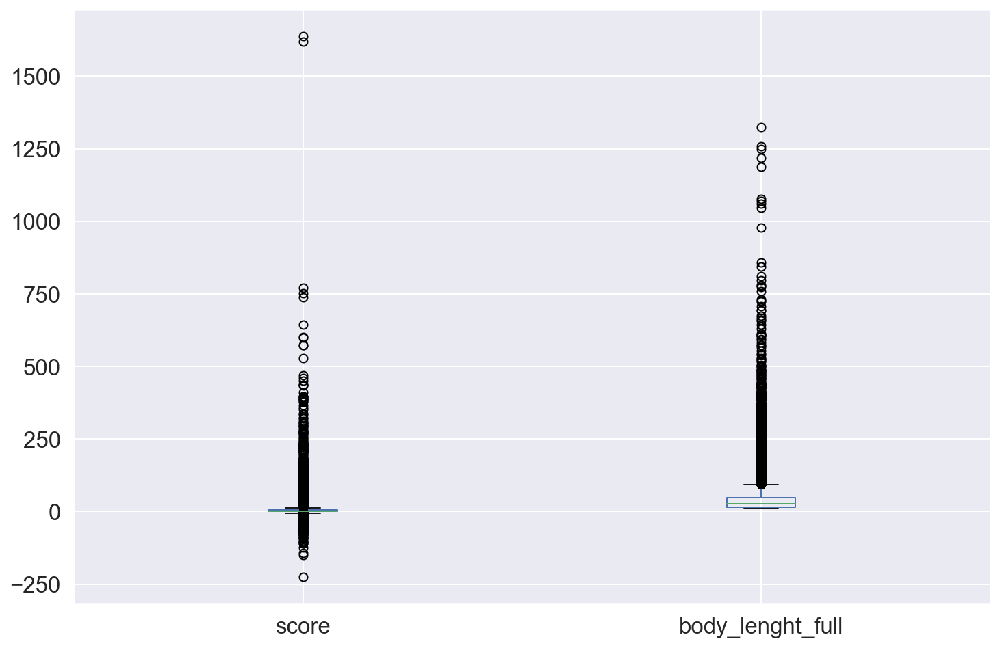

In [90]:
df_int_values.iloc[:,:2].plot.box(figsize=(12,8))

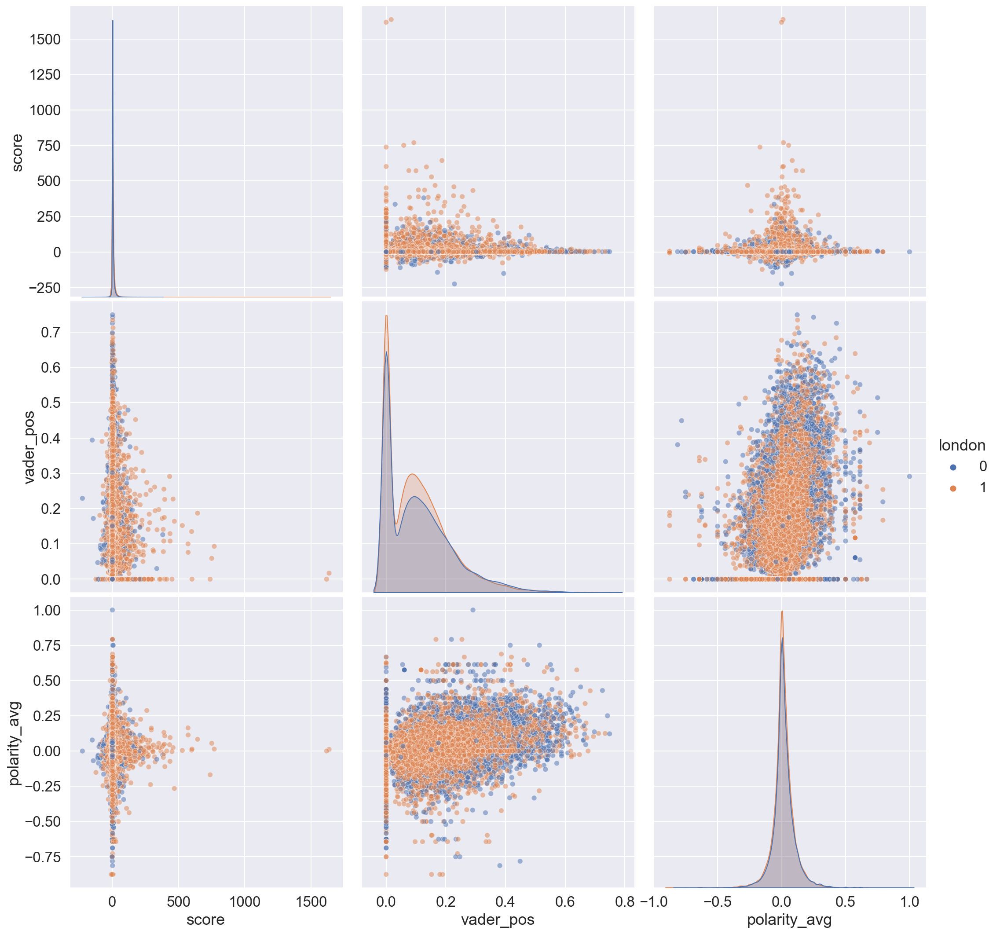

In [91]:
sns.pairplot(df_timerange_02, vars=['score','vader_pos','polarity_avg'], hue='london',
             plot_kws={'alpha': 0.5}, height=5)
plt.show()

In [92]:
for title in df_timerange_02[df_timerange_02.london==0].sort_values('vader_pos', ascending=False)['body'][0:5]:
    print(title)
    print('============================================================\n')

Best wishes and l hope he recovers soon. Take care

YES he’s definitely a gamer haha will share, thank you!!

Good luck! I hope you have a wonderful and healthy time!

You're right, great. Smashing photo thanks for sharing. Great stuff

Been recommended rufus as well, what would you recommend most? Thx man. Super helpful.



In [93]:
for title in df_timerange_02[df_timerange_02.london==1].sort_values('score', ascending=False)['body'][0:5]:
    print(title)
    print('============================================================\n')

This comment is for the attention of the Daily Mail journalist who will undoubtedly visit this subreddit later to get material for their latest hatchet job, urging commenters to think about Londoners as uncaring, stupid, or even downright cruel. But you see Mr or Mrs Hack Journalist, the reality (as others have pointed out) is that these people are probably on their way to jobs they can't afford to lose – perhaps even jobs that keep the country going in this time of need. For all you know they may work in manufacturing, logistics, even healthcare. You don't know who these people are, or where they're going, so don't cast aspersions. Furthermore, this a picture from one tube carriage *on an overall reduced service.* Fewer trains = more people crammed into each one. Were the tube operating at full capacity, you would see carriages almost or completely empty. So bear that in mind before you decide to turn public opinion against Londoners for the sake of clicks.

BRB just going out on my b

In [94]:
df_timerange_02.head(3)

,name,score,parent_id,depth,body,author,created_utc,subreddit_name_prefixed,date,body_lenght_full,processed_quote,tokenised_quotes,objectivity_avg,polarity_avg,vader_compound,vader_neg,vader_neu,vader_pos,london,lockdown
id,,,,,,,,,,,,,,,,,,,,
fkx2gjv,t1_fkx2gjv,1.0,t1_fhdulku,7.0,"Hey, how is the area around Saughton Rose Gard...",Jaraxo,1.584616e+09,r/Edinburgh,2020-03-19T11:11:07Z,35,area Gorgie fine area little rougher new build...,"[area, Gorgie, fine, area, little, rougher, ne...",0.915066,0.002359,-0.4137,0.084,0.879,0.037,0,0
fkzqsei,t1_fkzqsei,1.0,t1_fkx2gjv,8.0,"If it’s the new build flats I’m thinking of, S...",S27L,1.584678e+09,r/Edinburgh,2020-03-20T04:14:57Z,30,new build flats massive issues completion mort...,"[new, build, flats, massive, issues, completio...",0.901564,-0.003394,0.0000,0.000,1.000,0.000,0,1
fl01y80,t1_fl01y80,1.0,t1_fkzqsei,9.0,Yeh a few people having issues with getting mo...,Jaraxo,1.584688e+09,r/Edinburgh,2020-03-20T07:10:41Z,38,people issues mortgages concerns buyers 12mont...,"[people, issues, mortgages, concerns, buyers, ...",0.860118,0.013440,0.0000,0.000,1.000,0.000,0,1


for my next dataframe I removed comments that  had no score

In [95]:
len(df_timerange_02)

66878

In [96]:
df_timerange_03 = df_timerange_02[(df_timerange_02.score != 0) & (df_timerange_02.score != 1)]

In [97]:
len(df_timerange_03)

47719

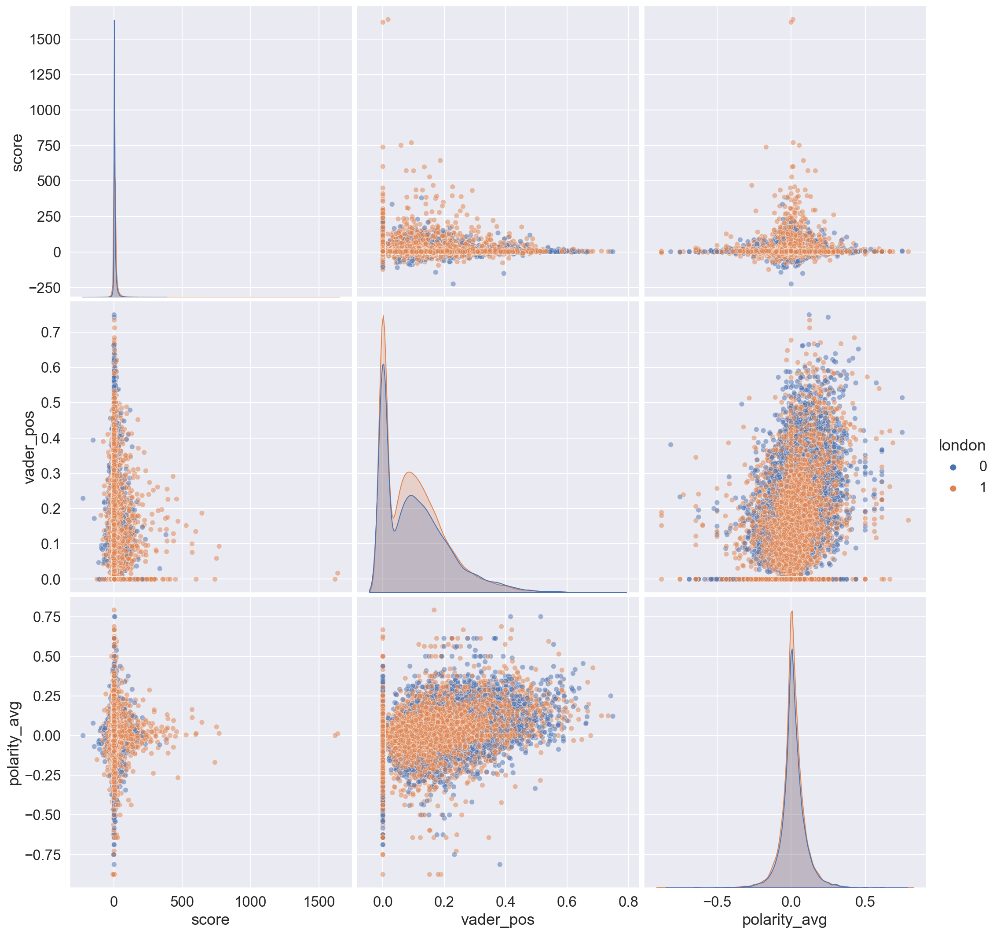

In [98]:
sns.pairplot(df_timerange_03, vars=['score','vader_pos','polarity_avg'], hue='london',
             plot_kws={'alpha': 0.5}, height=5)
plt.show()

When lost in NLP, do a word cloud........

In [99]:
from wordcloud import WordCloud

In [100]:

from sklearn.feature_extraction.text import TfidfVectorizer
from textblob import TextBlob
import nltk
import string
import re

In [101]:
def clean_text(text):
    """NLKT stop word and stemmer"""
    stopword = nltk.corpus.stopwords.words('english')
    ps = nltk.PorterStemmer()
    text_lc = "".join([word.lower() for word in text if word not in string.punctuation]) # remove puntuation
    text_rc = re.sub('[0-9]+', '', text_lc)
    tokens = re.split('\W+', text_rc)    # tokenization
    text = [ps.stem(word) for word in tokens if word not in stopword]  # remove stopwords and stemming
    return text

In [102]:
tvec = TfidfVectorizer(stop_words='english',tokenizer=clean_text,
                  use_idf=False,ngram_range=(2,3))
tvec.fit(df_timerange_03.body)
tdm = tvec.transform(df_timerange_03.body)
freqs = {word: tdm.getcol(idx).sum() for word, idx in tvec.vocabulary_.items()}


w = WordCloud(width=1600,height=1200,mode='RGBA',background_color='white',max_words=1000).fit_words(freqs)
plt.figure(figsize=(25,25))
plt.xticks([])
plt.yticks([])
plt.imshow(w)

/Users/eoinkeaney/opt/anaconda3/envs/spacy/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:489: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/Users/eoinkeaney/opt/anaconda3/envs/spacy/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['afterward', 'alon', 'alreadi', 'alway', 'anoth', 'anyon', 'anyth', 'anywher', 'becam', 'becom', 'besid', 'cri', 'describ', 'els', 'elsewher', 'empti', 'everi', 'everyon', 'everyth', 'everywher', 'fifti', 'formerli', 'forti', 'henc', 'hereaft', 'herebi', 'howev', 'hundr', 'inde', 'latterli', 'mani', 'meanwhil', 'moreov', 'mostli', 'nobodi', 'noon', 'noth', 'nowher', 'otherwis', 'perhap', 'pleas', 'seriou', 'sever', 'sinc', 'sincer', 'sixti', 'someon', 'someth', 'sometim', 'somewher', 'thenc', 'there

KeyboardInterrupt: 

In [ ]:
top_20 = pd.Series({n:freqs[n] for n in sorted(freqs, key=freqs.get, reverse=True)[:20]})
fig,ax = plt.subplots(figsize=(15,10))
sns.barplot(top_20.index, top_20,ax=ax,edgecolor='black')
ax.tick_params(labelrotation=23)
ax.set_title(f'Top 20 Highest Rated Stemmed Words')
ax.set_xlabel('Words')
ax.set_ylabel('Word Rating')
plt.plot()

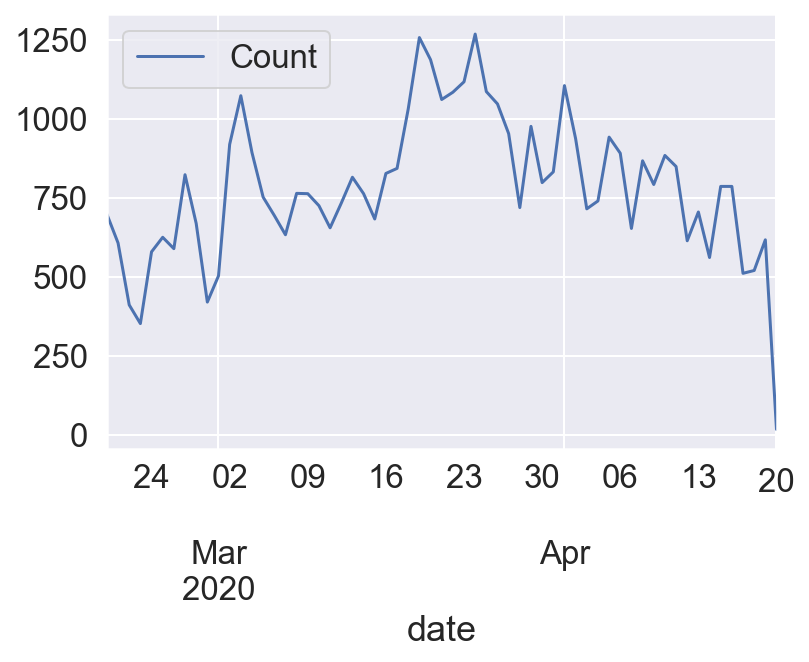

In [103]:
plot_day_count(df_timerange_03['date'])

In [104]:
[x for x in df_timerange_03.body if "look like" in x]

['> Looks like something from Forza Horizon 3 or 4\n\nYou know that video games look like real life, right, rather than the other way around?',
 'It was last night. This is what the shelves look like after being restocked....',
 'the 4 ticks and an O actually look like some weird face, probably increasing the chance of it being some rude neighbour\n\nAlso, I will copy in my answer from your askuk post, having now seen the note: \n\nI don’t think it’s official, look for some sort of police or gov logo to check. If it’s not, it could just be some snarky note from a neighbour. Worst case scenario it is a burglar but I don’t think they would leave a note.',
 "From the website it looks like they'll be landscaping the square as well - the plans make it look like a really nice outdoor seating area with trees etc!",
 'I used to live in greendykes, never really noticed much bother, but then again, I *do* look like I kill and eat lost hikers, so I may be a little biased',
 "It'll look like rain 

In [105]:
df_timerange_03[df_timerange_03.body.str.contains('look like')].head(4)

,name,score,parent_id,depth,body,author,created_utc,subreddit_name_prefixed,date,body_lenght_full,processed_quote,tokenised_quotes,objectivity_avg,polarity_avg,vader_compound,vader_neg,vader_neu,vader_pos,london,lockdown
id,,,,,,,,,,,,,,,,,,,,
fnguzpr,t1_fnguzpr,5.0,t1_fnf9oox,1.0,> Looks like something from Forza Horizon 3 or...,President-Nulagi,1.586946e+09,r/Leeds,2020-04-15T11:19:26Z,26,video games real life way,"[video, games, real, life, way]",0.950153,0.003887,0.6124,0.000,0.828,0.172,0,1
fjs3m80,t1_fjs3m80,2.0,t1_fjqh2af,1.0,It was last night. This is what the shelves lo...,lilgeoffrey,1.583593e+09,r/Edinburgh,2020-03-07T15:02:52Z,14,night shelves,"[night, shelves]",0.960938,-0.023438,0.3612,0.000,0.839,0.161,0,0
fjxowco,t1_fjxowco,8.0,t1_fjxo7au,1.0,the 4 ticks and an O actually look like some w...,WannabeVirgil,1.583680e+09,r/Edinburgh,2020-03-08T15:02:55Z,83,ticks O actually weird face probably chance ru...,"[ticks, O, actually, weird, face, probably, ch...",0.863551,-0.011091,-0.4497,0.082,0.881,0.037,0,0
fk9114x,t1_fk9114x,2.0,t1_fk7am9u,3.0,From the website it looks like they'll be land...,Grumpasaurussss,1.583967e+09,r/Edinburgh,2020-03-11T22:43:08Z,29,website square plans nice outdoor seating area...,"[website, square, plans, nice, outdoor, seatin...",0.899609,0.081641,0.8585,0.000,0.705,0.295,0,0


looking at the distribution of set words

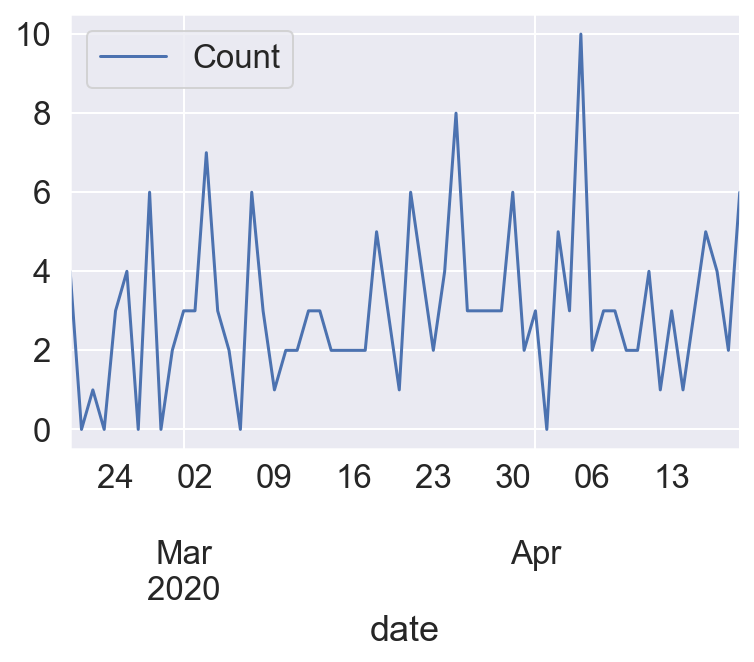

In [106]:
plot_day_count(df_timerange_03[df_timerange_03.body.str.lower().str.contains(r'look like')]['date'])

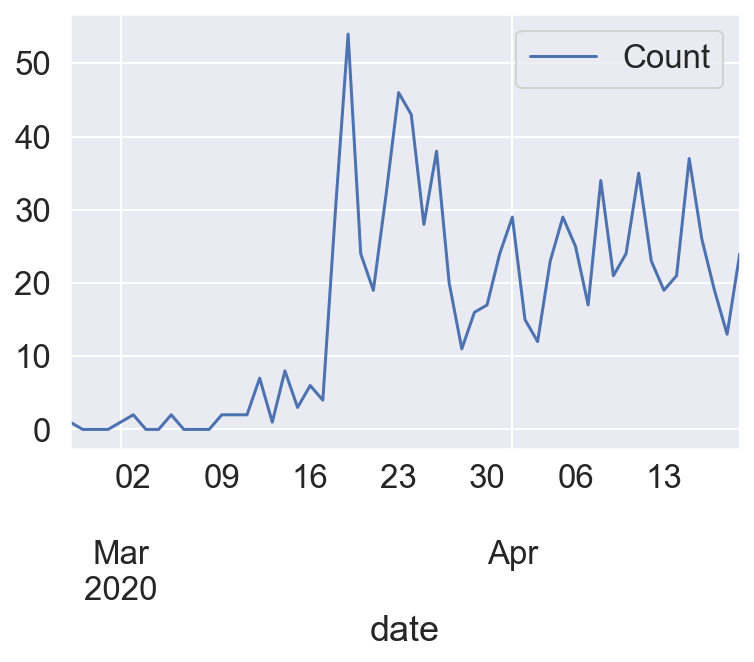

In [107]:
plot_day_count(df_timerange_03[df_timerange_03.body.str.lower().str.contains('lockdown')]['date'])

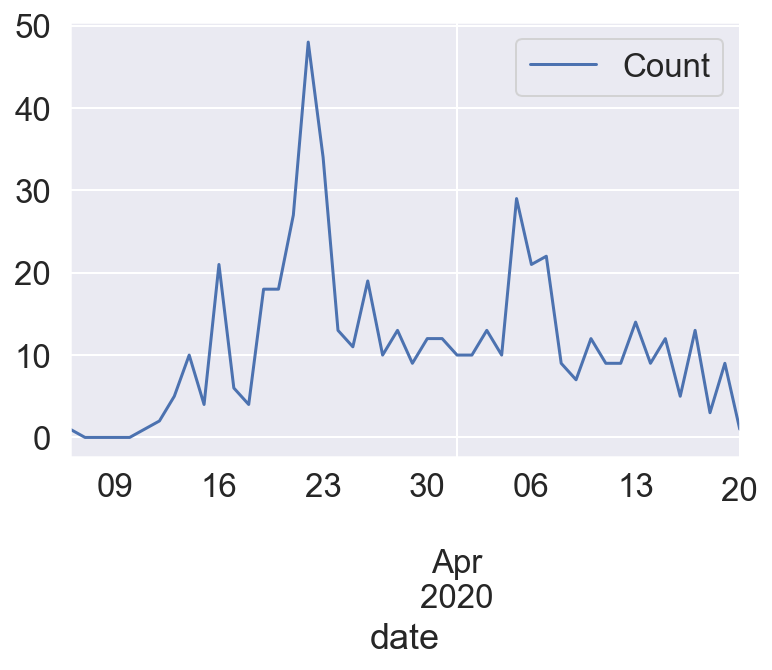

In [108]:
plot_day_count(df_timerange_03[df_timerange_03.body.str.lower().str.contains('social dist')]['date'])

Next dataframe I wanted to index by timeseries

In [109]:
type(df_timerange_03.date.iloc[4])

str

In [110]:
df_timerange_04 = df_timerange_03

In [111]:
df_timerange_03['dt_index'] = pd.to_datetime(df_timerange_04.date)

<ipython-input-111-a4bf10666a8c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timerange_03['dt_index'] = pd.to_datetime(df_timerange_04.date)


In [112]:
df_timerange_04.set_index('dt_index', inplace=True, drop=True)

In [113]:
df_timerange_04.head()

,name,score,parent_id,depth,body,author,created_utc,subreddit_name_prefixed,date,body_lenght_full,processed_quote,tokenised_quotes,objectivity_avg,polarity_avg,vader_compound,vader_neg,vader_neu,vader_pos,london,lockdown
dt_index,,,,,,,,,,,,,,,,,,,,
2020-03-20 08:01:41+00:00,t1_fl04ld7,2.0,t1_fl04hqv,2.0,Oh dear that doesn't sound good. Then it becom...,Jaraxo,1.584691e+09,r/Edinburgh,2020-03-20T08:01:41Z,49,good health issue thing advice Lots properties...,"[good, health, issue, thing, advice, Lots, pro...",0.862047,0.105587,0.8307,0.042,0.747,0.212,0,1
2020-02-24 06:29:05+00:00,t1_fimd8al,2.0,t3_elylpz,0.0,Headhunters is the best for Muay Thai and MMA ...,Jayc2T,1.582526e+09,r/Edinburgh,2020-02-24T06:29:05Z,14,Headhunters best word,"[Headhunters, best, word]",0.770833,0.183532,0.6369,0.000,0.756,0.244,0,0
2020-03-20 16:13:26+00:00,t1_fl12n9a,2.0,t1_ffxdlsx,3.0,was LittleJohns ^^ finally moved out and depos...,Tinchyschniber,1.584721e+09,r/Edinburgh,2020-03-20T16:13:26Z,16,finally ties,"[finally, ties]",1.000000,0.000000,-0.3321,0.136,0.864,0.000,0,1
2020-04-06 18:57:43+00:00,t1_fmlz7ro,3.0,t3_fw1cma,0.0,I've bought some on the stalk at morrisons (th...,ikea-trash,1.586196e+09,r/Leeds,2020-04-06T18:57:43Z,29,stalk morrisons city centre ago worth close,"[stalk, morrisons, city, centre, ago, worth, c...",0.937698,0.036111,0.3903,0.000,0.914,0.086,0,1
2020-04-06 20:32:25+00:00,t1_fmma10t,9.0,t3_fw4ckm,0.0,I would try to ring local pharmacies to see if...,tofu_splop,1.586202e+09,r/Leeds,2020-04-06T20:32:25Z,41,local pharmacies stock able alternative medica...,"[local, pharmacies, stock, able, alternative, ...",0.932675,-0.026425,0.9172,0.000,0.761,0.239,0,1


In [114]:
df_timerange_04.resample('W').mean()

,score,depth,created_utc,body_lenght_full,objectivity_avg,polarity_avg,vader_compound,vader_neg,vader_neu,vader_pos,london,lockdown
dt_index,,,,,,,,,,,,
2020-02-23 00:00:00+00:00,7.137331,1.282398,1.582310e+09,42.036267,0.861464,0.013293,0.144033,0.069910,0.819283,0.110807,0.457447,0.000000
2020-03-01 00:00:00+00:00,7.256892,1.268298,1.582802e+09,41.951759,0.862924,0.016899,0.166157,0.064452,0.825213,0.110332,0.467205,0.000000
2020-03-08 00:00:00+00:00,7.934008,1.558834,1.583396e+09,40.064420,0.856222,0.013094,0.109047,0.076030,0.814413,0.109563,0.521997,0.000000
2020-03-15 00:00:00+00:00,7.396535,1.268834,1.584024e+09,40.005256,0.862425,0.012637,0.102338,0.072287,0.824867,0.102847,0.476737,0.000000
2020-03-22 00:00:00+00:00,7.792730,1.307545,1.584644e+09,42.163512,0.862396,0.012714,0.090175,0.073112,0.825892,0.100999,0.594787,0.457064
2020-03-29 00:00:00+00:00,8.743930,1.390315,1.585213e+09,39.941948,0.862475,0.013066,0.090173,0.076096,0.821399,0.102509,0.560424,1.000000
2020-04-05 00:00:00+00:00,7.844291,1.561542,1.585830e+09,42.304993,0.861958,0.012124,0.107117,0.073196,0.823195,0.103605,0.521997,1.000000
2020-04-12 00:00:00+00:00,8.140721,1.459459,1.586432e+09,40.918198,0.864790,0.012672,0.104688,0.072119,0.823961,0.103922,0.538559,1.000000
2020-04-19 00:00:00+00:00,7.569104,1.428221,1.587032e+09,42.686580,0.859501,0.015908,0.160945,0.065593,0.824716,0.109693,0.587383,1.000000


In [115]:
'objectivity_avg','polarity_avg'

('objectivity_avg', 'polarity_avg')

<AxesSubplot:xlabel='dt_index'>

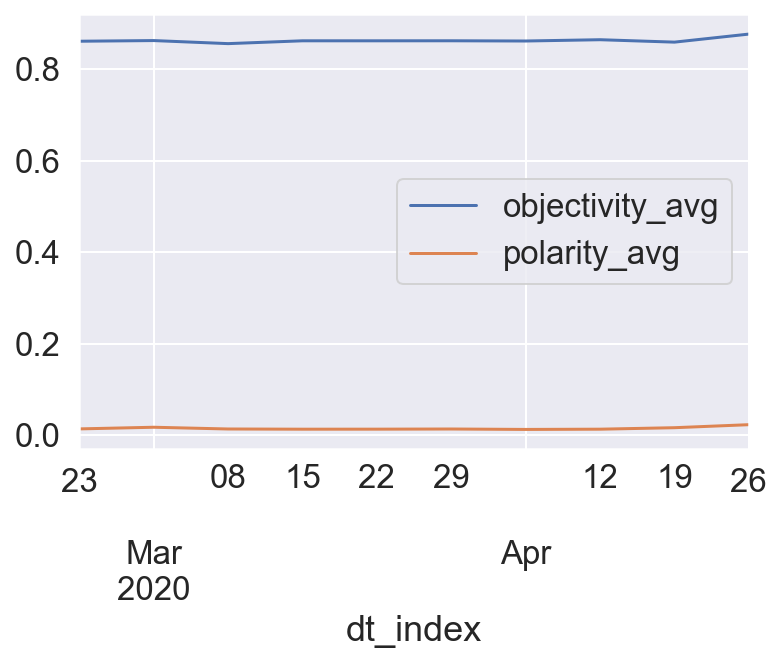

In [116]:
df_timerange_04[['objectivity_avg','polarity_avg']].resample('W').mean().plot()

<AxesSubplot:xlabel='dt_index'>

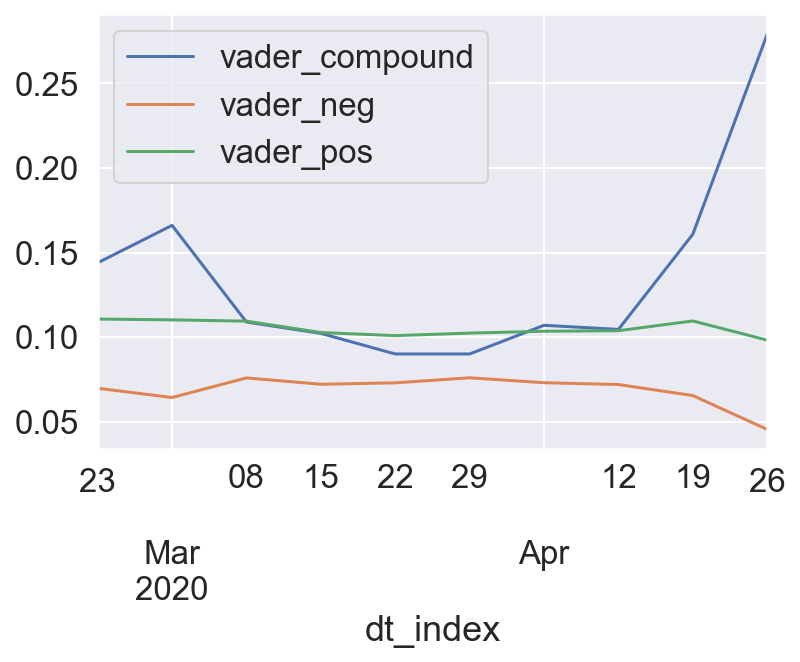

In [117]:
df_timerange_04[['vader_compound','vader_neg','vader_pos']].resample('W').mean().plot()

ok, what going on with vader_compound (will look into it over the weeekend)

In [119]:
df_timerange_04.rolling(window=7).mean()

,score,depth,created_utc,body_lenght_full,objectivity_avg,polarity_avg,vader_compound,vader_neg,vader_neu,vader_pos,london,lockdown
dt_index,,,,,,,,,,,,
2020-03-20 08:01:41+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-24 06:29:05+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-20 16:13:26+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-06 18:57:43+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-06 20:32:25+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-15 03:06:39+00:00,3.285714,0.714286,1.586909e+09,23.857143,0.886916,0.064758,0.235729,0.063143,0.767857,0.169143,1.0,1.0
2020-04-14 23:58:23+00:00,4.142857,0.714286,1.586911e+09,22.142857,0.904773,0.046901,0.320300,0.034286,0.784714,0.181143,1.0,1.0
2020-04-15 04:44:32+00:00,3.714286,0.571429,1.586915e+09,22.000000,0.901453,0.056046,0.524357,0.005000,0.787143,0.208000,1.0,1.0


<AxesSubplot:xlabel='dt_index'>

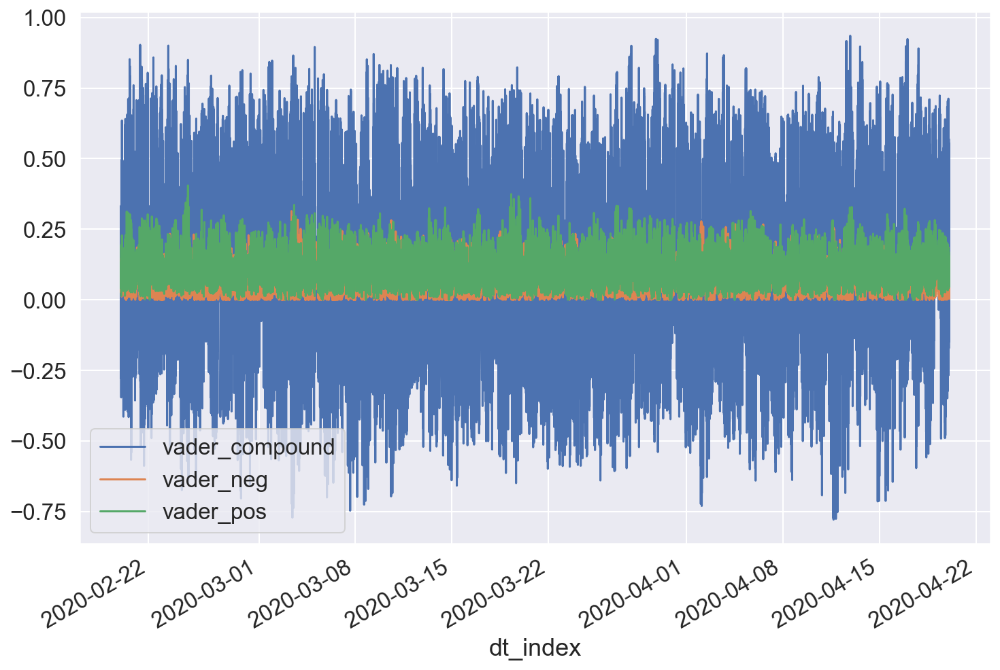

In [120]:
df_timerange_04[['vader_compound','vader_neg','vader_pos']].rolling(window=7).mean().plot(figsize=(12,8))

<AxesSubplot:xlabel='dt_index'>

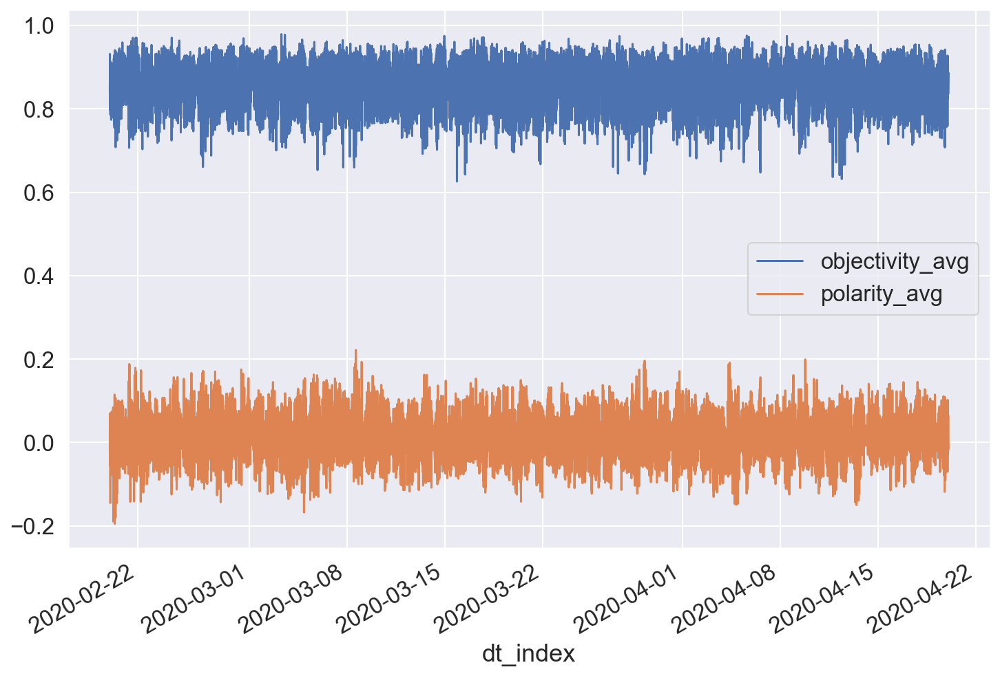

In [121]:
df_timerange_04[['objectivity_avg','polarity_avg']].rolling(window=7).mean().plot(figsize=(12,8))

In [123]:
df_timerange_05 = df_timerange_04

In [162]:
df_timerange_03.iloc[30]

name                                                              t1_fmpn3x6
score                                                                    2.0
parent_id                                                         t1_fmouu4d
depth                                                                    3.0
body                       Well the parking wardens wouldn't be working a...
author                                                                Snoron
created_utc                                                     1586283777.0
subreddit_name_prefixed                                              r/Leeds
date                                                    2020-04-07T19:22:57Z
body_lenght_full                                                          25
processed_quote                              parking wardens people official
tokenised_quotes                        [parking, wardens, people, official]
objectivity_avg                                                       0.9875

In [199]:
df_timerange_05[df_timerange_05.name == 't1_fmouu4d'].depth.values[0]

2.0

In [160]:
def lookup_parent(df):
    new = df.copy()
    new['p_score'] = 0.0
    new['p_body_lenght_full'] = 0
    new['p_vader_compound'] = 0
    new['p_vader_neg'] = 0
    new['p_vader_neu'] = 0
    new['p_vader_pos'] = 0
    new['p_objectivity_avg'] = 0
    new['p_polarity_avg'] = 0
    for index,row in new.iterrows():
        if int(row.depth) != 0:
            lookup = new[new.name == row.parent_id]
            if len(lookup) == 1:
                new.at['index', 'p_score'] = lookup.score
                new.at['index', 'p_body_lenght_full'] =  lookup.body_lenght_full
                new.at['index', 'p_vader_compound'] =  lookup.vader_compound
                new.at['index', 'p_vader_neg'] =  lookup.vader_neg
                new.at['index', 'p_vader_neu'] =  lookup.vader_neu
                new.at['index', 'p_vader_pos'] =  lookup.vader_pos
                new.at['index', 'p_objectivity_avg'] =  lookup.objectivity_avg
                new.at['index', 'p_polarity_avg'] =  lookup.polarity_avg

                
                
                
                
                
#                 new['p_score'].iloc[index] = lookup.score
#                 new['p_body_lenght_full'].iloc[index] = lookup.body_lenght_full
#                 new['p_vader_compound'].iloc[index] = lookup.vader_compound
#                 new['p_vader_neg'].iloc[index] = lookup.vader_neg
#                 new['p_vader_neu'].iloc[index] = lookup.vader_neu
#                 new['p_vader_pos'].iloc[index] = lookup.vader_pos
#                 new['p_objectivity_avg'].iloc[index] = lookup.objectivity_avg
#                 new['p_polarity_avg'].iloc[index] = lookup.polarity_avg
            
    return new

In [200]:
def lookup_parent(df):

    p_score = []
    p_body_lenght_full = []
    p_vader_compound = []
    p_vader_neg = []
    p_vader_neu = []
    p_vader_pos = []
    p_objectivity_avg = []
    p_polarity_avg = []
    
    
    for index,row in df.iterrows():
        if int(row.depth) != 0:
            lookup = df[df.name == row.parent_id]
            if len(lookup) == 1:
                p_score.append(lookup.score.values[0])
                p_body_lenght_full.append(lookup.body_lenght_full.values[0])
                p_vader_compound.append(lookup.vader_compound.values[0])
                p_vader_neg.append(lookup.vader_neg.values[0])
                p_vader_neu.append(lookup.vader_neu.values[0])
                p_vader_pos.append(lookup.vader_pos.values[0])
                p_objectivity_avg.append(lookup.objectivity_avg.values[0])
                p_polarity_avg.append(lookup.polarity_avg.values[0])
            else:
                p_score.append(0.0)
                p_body_lenght_full.append(0)
                p_vader_compound.append(0.0)
                p_vader_neg.append(0.0)
                p_vader_neu.append(0.0)
                p_vader_pos.append(0.0)
                p_objectivity_avg.append(0.0)
                p_polarity_avg.append(0.0)
        else:
            p_score.append(0.0)
            p_body_lenght_full.append(0)
            p_vader_compound.append(0.0)
            p_vader_neg.append(0.0)
            p_vader_neu.append(0.0)
            p_vader_pos.append(0.0)
            p_objectivity_avg.append(0.0)
            p_polarity_avg.append(0.0)
            
                
                
    df['p_score'] = p_score
    df['p_body_lenght_full'] = p_body_lenght_full
    df['p_vader_compound'] = p_vader_compound
    df['p_vader_neg'] = p_vader_neg
    df['p_vader_neu'] = p_vader_neu
    df['p_vader_pos'] = p_vader_pos
    df['p_objectivity_avg'] = p_objectivity_avg
    df['p_polarity_avg'] = p_polarity_avg           
                
    return df

In [201]:
df_timerange_06 = lookup_parent(df_timerange_03)

<ipython-input-200-c0e66bccd50b>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['p_score'] = p_score
<ipython-input-200-c0e66bccd50b>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['p_body_lenght_full'] = p_body_lenght_full
<ipython-input-200-c0e66bccd50b>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gu

In [208]:
df_timerange_06.columns

Index(['name', 'score', 'parent_id', 'depth', 'body', 'author', 'created_utc',
       'subreddit_name_prefixed', 'date', 'body_lenght_full',
       'processed_quote', 'tokenised_quotes', 'objectivity_avg',
       'polarity_avg', 'vader_compound', 'vader_neg', 'vader_neu', 'vader_pos',
       'london', 'lockdown', 'p_score', 'p_body_lenght_full',
       'p_vader_compound', 'p_vader_neg', 'p_vader_neu', 'p_vader_pos',
       'p_objectivity_avg', 'p_polarity_avg'],
      dtype='object')

In [175]:
new_int_values = ['score', 'depth',  'body_lenght_full',
        'objectivity_avg', 'polarity_avg', 'vader_compound', 'vader_neg', 'vader_neu', 'vader_pos',
       'p_score', 'p_body_lenght_full', 'p_vader_compound', 'p_vader_neg', 'p_vader_neu', 'p_vader_pos',
       'p_objectivity_avg', 'p_polarity_avg']

In [140]:
test_row = df_timerange_05[df_timerange_05.name == 't1_fmouu4d']

In [211]:
df_timerange_06[df_timerange_06.p_body_lenght_full != 0][new_int_values]

,score,depth,body_lenght_full,objectivity_avg,polarity_avg,vader_compound,vader_neg,vader_neu,vader_pos,p_score,p_body_lenght_full,p_vader_compound,p_vader_neg,p_vader_neu,p_vader_pos,p_objectivity_avg,p_polarity_avg
dt_index,,,,,,,,,,,,,,,,,
2020-04-07 14:24:18+00:00,14.0,1.0,10,0.878472,-0.072917,0.5106,0.000,0.732,0.268,30.0,26,0.1007,0.091,0.806,0.104,0.825000,-0.066270
2020-04-07 14:38:07+00:00,19.0,1.0,15,0.975000,0.025000,0.0000,0.000,1.000,0.000,69.0,13,0.4215,0.000,0.811,0.189,0.761508,0.172421
2020-04-07 16:33:04+00:00,3.0,1.0,12,0.968750,0.031250,0.0000,0.000,1.000,0.000,2.0,30,0.5574,0.000,0.859,0.141,0.833333,-0.005291
2020-04-07 15:15:16+00:00,6.0,2.0,13,0.861111,-0.006944,-0.2023,0.130,0.870,0.000,14.0,10,0.5106,0.000,0.732,0.268,0.878472,-0.072917
2020-04-07 15:15:48+00:00,2.0,2.0,18,0.775000,0.072619,0.7096,0.000,0.685,0.315,19.0,15,0.0000,0.000,1.000,0.000,0.975000,0.025000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-15 12:17:58+00:00,2.0,4.0,23,0.720238,0.096939,0.0772,0.129,0.662,0.209,-7.0,29,-0.4400,0.188,0.648,0.164,0.888542,-0.108333
2020-04-15 12:42:02+00:00,-1.0,4.0,46,0.932935,-0.034431,-0.8074,0.176,0.785,0.039,2.0,55,-0.9163,0.233,0.695,0.072,0.840521,-0.101364
2020-04-15 01:33:51+00:00,6.0,1.0,37,0.962500,0.037500,-0.0422,0.079,0.846,0.075,4.0,22,0.0000,0.000,1.000,0.000,0.975000,-0.005000


In [141]:
test_row.depth

dt_index
2020-04-07 15:15:16+00:00    2.0
Name: depth, dtype: float64

In [151]:
for index, row in df_timerange_05.iloc[3:8].iterrows():
    print(index,row.depth)

2020-04-06 18:57:43+00:00 0.0
2020-04-06 20:32:25+00:00 0.0
2020-04-06 20:56:52+00:00 0.0
2020-04-06 22:03:58+00:00 0.0
2020-04-06 21:40:06+00:00 0.0


In [203]:
df_timerange_06[new_int_values].corr

<bound method DataFrame.corr of                            score  depth  body_lenght_full  objectivity_avg  \
dt_index                                                                     
2020-03-20 08:01:41+00:00    2.0    2.0                49         0.862047   
2020-02-24 06:29:05+00:00    2.0    0.0                14         0.770833   
2020-03-20 16:13:26+00:00    2.0    3.0                16         1.000000   
2020-04-06 18:57:43+00:00    3.0    0.0                29         0.937698   
2020-04-06 20:32:25+00:00    9.0    0.0                41         0.932675   
...                          ...    ...               ...              ...   
2020-04-15 03:06:39+00:00    2.0    0.0                21         0.890179   
2020-04-14 23:58:23+00:00    9.0    0.0                16         1.000000   
2020-04-15 04:44:32+00:00    2.0    0.0                31         0.840675   
2020-04-15 00:38:12+00:00    2.0    0.0               310         0.871209   
2020-04-15 00:51:27+00:00   -1.0

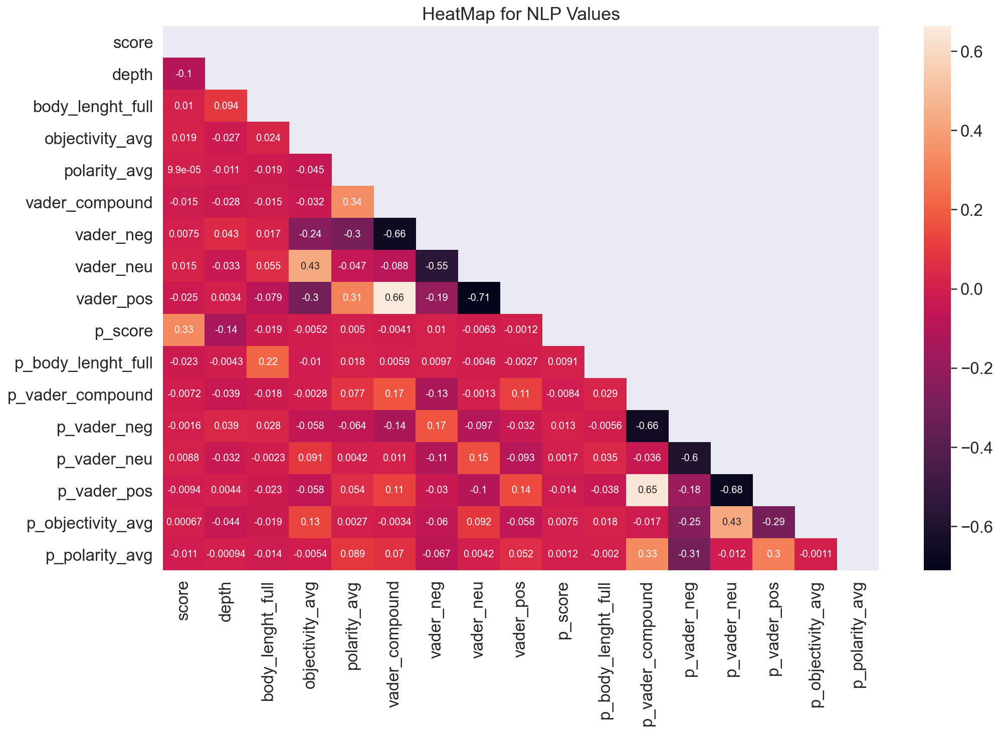

In [212]:
# Set the default matplotlib figure size:
fig, ax = plt.subplots(figsize=(16, 10))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(df_timerange_06[df_timerange_06.p_body_lenght_full != 0][new_int_values].corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
sns.heatmap(df_timerange_06[df_timerange_06.p_body_lenght_full != 0][new_int_values].corr(), mask=mask, annot=True, ax=ax)
# ax.set_yticks(np.arange(0, X.shape[1])+0.1)
# ax.set_ylim([X.shape[1], 0])
plt.title('HeatMap for NLP Values')
plt.show()

I have found my target

In [192]:
df_timerange_03[new_int_values[9:]].iloc[403]

p_score               dt_index
2020-03-05 13:16:07+00:00    29.0
Nam...
p_body_lenght_full    dt_index
2020-03-05 13:16:07+00:00    33
Name:...
p_vader_compound      dt_index
2020-03-05 13:16:07+00:00   -0.7506
N...
p_vader_neg           dt_index
2020-03-05 13:16:07+00:00    0.171
Na...
p_vader_neu           dt_index
2020-03-05 13:16:07+00:00    0.829
Na...
p_vader_pos           dt_index
2020-03-05 13:16:07+00:00    0.0
Name...
p_objectivity_avg     dt_index
2020-03-05 13:16:07+00:00    0.775
Na...
p_polarity_avg        dt_index
2020-03-05 13:16:07+00:00   -0.025
Na...
Name: 2020-03-05 15:01:10+00:00, dtype: object